In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from random import randint
from time import time

In [2]:
def process_pixel(x, y, img_data, final_img_data, filled_map, kernel_size):

    x_start = max(0, x - kernel_size)
    y_start = max(0, y - kernel_size) 
    x_final = min(final_img_data.shape[0] - 1, x + kernel_size)
    y_final = min(final_img_data.shape[1] - 1, y + kernel_size)

    """
    neigh_window -> window considered on the final image
    filled_map_window -> information about which pixels are already filled
    """
    neigh_window = final_img_data[x_start : x_final, y_start : y_final]
    filled_map_window = filled_map[x_start : x_final, y_start : y_final]
    
    len_filled_map = float(len(filled_map_window==True))

    xs, ys = neigh_window.shape
    img_size_x, img_size_y = img_data.shape

    """
    cx, cy are the centers of the windows which we consider to fill.
    """
    cx = int(np.floor(xs/2))
    cy = int(np.floor(ys/2))

    candidates = []
    dists = []

    for i in range(xs, img_size_x - xs):
        for j in range(ys, img_size_y - ys):
            if(randint(0,2) != 0): 
                continue
            """
            sub_window -> The patch of the original image which we are trying to fit.
            """
            sub_window = img_data[i : i+xs, j : j+ys]

            """
            diff -> stores the difference(error)
            """
            diff = np.square(sub_window - neigh_window)
            
            """
            Considering the error with already filled patch.
            It makes sure that we get the right patch from original image.
            """
            error = diff*diff*filled_map_window
            err = np.sum(error) / len_filled_map
            
            candidates.append(sub_window[cx, cy])
            dists.append(err)

    possible_candidates_position = dists - np.min(dists) < 0.2
    
    """
    considering only those candidates which have error less than some threshold
    """
    candidates = np.extract(possible_candidates_position, candidates)   

    if len(candidates) < 1:    
        """
        Will tend to make progress of our code 0, resulting in increment of err_threshold
        """
        return 0.0
    elif len(candidates)==1:
        return candidates[0]
    else:
        """
        Returning any random candidate
        """
        return candidates[randint(0, len(candidates) - 1)]

In [20]:
def efros_leung(img_data, output_file, final_size_x, final_size_y, kernel_size, t):

    patch_size_x, patch_size_y = img_data.shape
    size_seed_x = 3
    size_seed_y = 3
    seed_x = randint(0, size_seed_x)
    seed_y = randint(0, size_seed_y)

    """
    Seed image is the part of original image which we take initially to further
    synthesize our texture
    """
    seed_data = img_data[seed_x : seed_x + size_seed_x, seed_y : seed_y + size_seed_y]

    """
    Initializing our new image as "final_image_data"
    """
    final_image_data = np.zeros((final_size_x, final_size_y))
    
    """
    Initializing a array map which will tell which all pixels are left to be synthesized.
    """
    filled_map = np.ones((final_size_x, final_size_y)) == False

    
    filled_map[0: size_seed_x, 0: size_seed_y] = True
    final_image_data[0: size_seed_x, 0: size_seed_y] = seed_data

    it = 0
    for i in range(size_seed_x, final_size_x):
        
        print("Iteration " +str(i) + "/" +str(final_size_x) +"\tTime: " + str(time() - t) + " seconds")
        """
        1 1 1 x 0 0 0 0
        1 1 1 x 0 0 0 0
        1 1 1 x 0 0 0 0
        x x x x 0 0 0 0
        0 0 0 0 0 0 0 0
        0 0 0 0 0 0 0 0
        0 0 0 0 0 0 0 0
        
        1 -> already synthesized image.
        x -> Portion which we will consider in this iteration.
        0 -> Remaing portion of the image.
        """
        last_y = size_seed_x + it
        for j in range(0, last_y + 1):
            v = process_pixel(i, j, img_data, final_image_data, filled_map, kernel_size)
            final_image_data[i, j] = v
            filled_map[i, j] = True
            
        for x in range(0, size_seed_y + it + 1):
            v = process_pixel(x, last_y, img_data, final_image_data, filled_map, kernel_size)
            final_image_data[x, last_y] = v
            filled_map[x, last_y] = True
        it += 1
        
        if(it % 10 == 0) :
            img_new = Image.fromarray(final_image_data)
            img_new.convert("RGB").save(output_file)
            plt.figure(figsize=(8, 8))
            plt.imshow(img_new)
            plt.show()

    return img_new

In [4]:
def texture_synthesize(filename, output_file, final_size_x=256, final_size_y=256,\
                       kernel_size=21, resize_factor=128):
    img = Image.open(filename)
    img_data = img.convert("L").resize((resize_factor, resize_factor))
    img_data = np.array(img_data)
    
    t = time()

    img_new = efros_leung(img_data, output_file, final_size_x, final_size_y, kernel_size/2, t)

    print("Total Time: ", time() - t, " seconds")
    


Iteration 3/256	Time: 0.000205039978027 seconds
Iteration 4/256	Time: 0.0609221458435 seconds
Iteration 5/256	Time: 0.125349998474 seconds
Iteration 6/256	Time: 0.196765184402 seconds
Iteration 7/256	Time: 0.287370204926 seconds
Iteration 8/256	Time: 0.383154153824 seconds
Iteration 9/256	Time: 0.483820199966 seconds
Iteration 10/256	Time: 0.58351111412 seconds
Iteration 11/256	Time: 0.683709144592 seconds
Iteration 12/256	Time: 0.798135042191 seconds


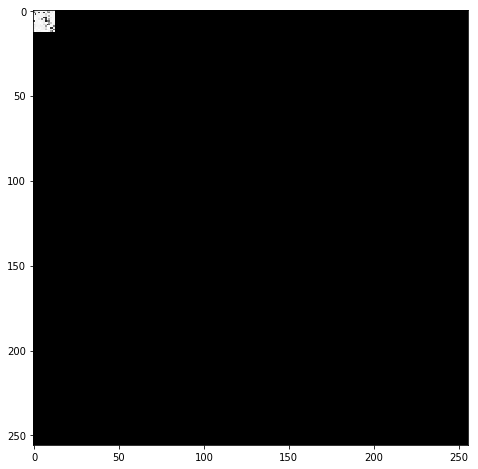

Iteration 13/256	Time: 1.07075119019 seconds
Iteration 14/256	Time: 1.19852209091 seconds
Iteration 15/256	Time: 1.32358002663 seconds
Iteration 16/256	Time: 1.46823120117 seconds
Iteration 17/256	Time: 1.61614108086 seconds
Iteration 18/256	Time: 1.77060103416 seconds
Iteration 19/256	Time: 1.92952919006 seconds
Iteration 20/256	Time: 2.08225107193 seconds
Iteration 21/256	Time: 2.24628806114 seconds
Iteration 22/256	Time: 2.40956306458 seconds


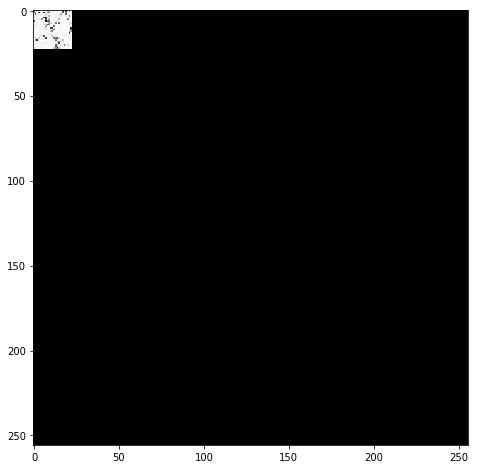

Iteration 23/256	Time: 2.73516702652 seconds
Iteration 24/256	Time: 2.92602920532 seconds
Iteration 25/256	Time: 3.11734509468 seconds
Iteration 26/256	Time: 3.30607223511 seconds
Iteration 27/256	Time: 3.51460123062 seconds
Iteration 28/256	Time: 3.70935702324 seconds
Iteration 29/256	Time: 3.89688420296 seconds
Iteration 30/256	Time: 4.08860015869 seconds
Iteration 31/256	Time: 4.29597306252 seconds
Iteration 32/256	Time: 4.51233315468 seconds


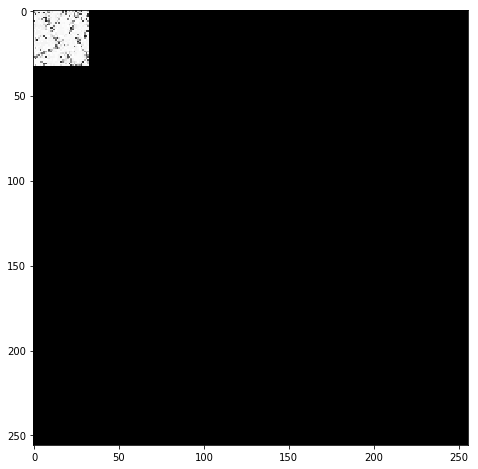

Iteration 33/256	Time: 4.88759112358 seconds
Iteration 34/256	Time: 5.1301150322 seconds
Iteration 35/256	Time: 5.36336421967 seconds
Iteration 36/256	Time: 5.60602211952 seconds
Iteration 37/256	Time: 5.84821009636 seconds
Iteration 38/256	Time: 6.10816907883 seconds
Iteration 39/256	Time: 6.35588908195 seconds
Iteration 40/256	Time: 6.62028622627 seconds
Iteration 41/256	Time: 6.91923713684 seconds
Iteration 42/256	Time: 7.20282316208 seconds


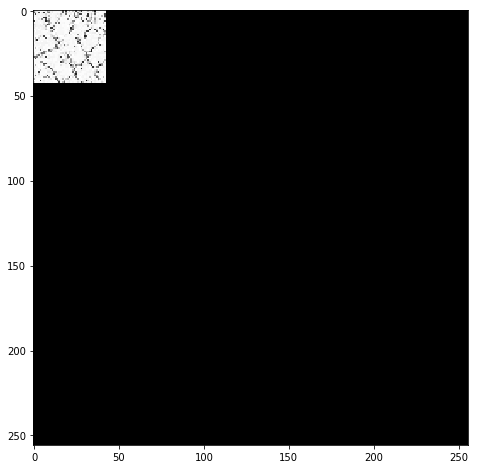

Iteration 43/256	Time: 7.6725962162 seconds
Iteration 44/256	Time: 7.98265600204 seconds
Iteration 45/256	Time: 8.31357622147 seconds
Iteration 46/256	Time: 8.64426016808 seconds
Iteration 47/256	Time: 8.96997714043 seconds
Iteration 48/256	Time: 9.31228613853 seconds
Iteration 49/256	Time: 9.65526604652 seconds
Iteration 50/256	Time: 10.0063400269 seconds
Iteration 51/256	Time: 10.3807020187 seconds
Iteration 52/256	Time: 10.7403781414 seconds


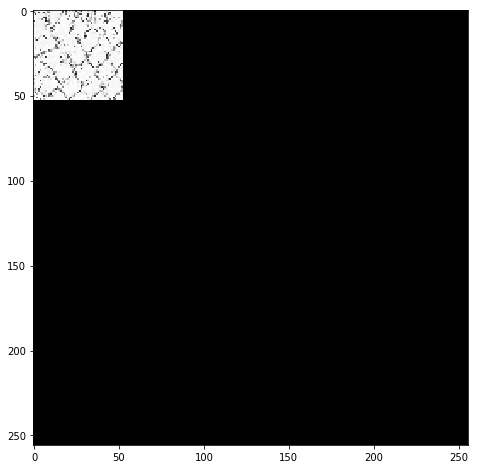

Iteration 53/256	Time: 11.2727980614 seconds
Iteration 54/256	Time: 11.6294760704 seconds
Iteration 55/256	Time: 11.9842112064 seconds
Iteration 56/256	Time: 12.333135128 seconds
Iteration 57/256	Time: 12.7185280323 seconds
Iteration 58/256	Time: 13.099905014 seconds
Iteration 59/256	Time: 13.4742541313 seconds
Iteration 60/256	Time: 13.8771131039 seconds
Iteration 61/256	Time: 14.2609090805 seconds
Iteration 62/256	Time: 14.6455521584 seconds


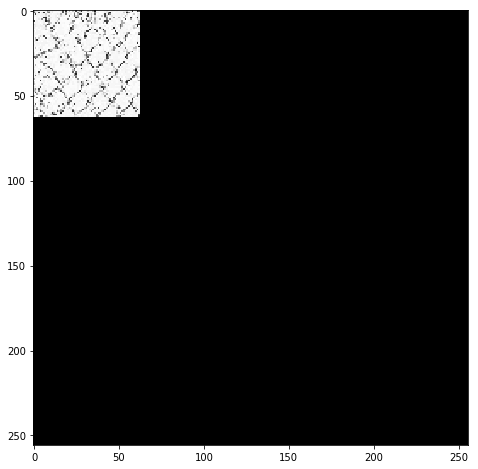

Iteration 63/256	Time: 15.1652500629 seconds
Iteration 64/256	Time: 15.610530138 seconds
Iteration 65/256	Time: 16.0401492119 seconds
Iteration 66/256	Time: 16.6529951096 seconds
Iteration 67/256	Time: 17.1987991333 seconds
Iteration 68/256	Time: 17.6536002159 seconds
Iteration 69/256	Time: 18.1268250942 seconds
Iteration 70/256	Time: 18.5659360886 seconds
Iteration 71/256	Time: 19.0345451832 seconds
Iteration 72/256	Time: 19.5387542248 seconds


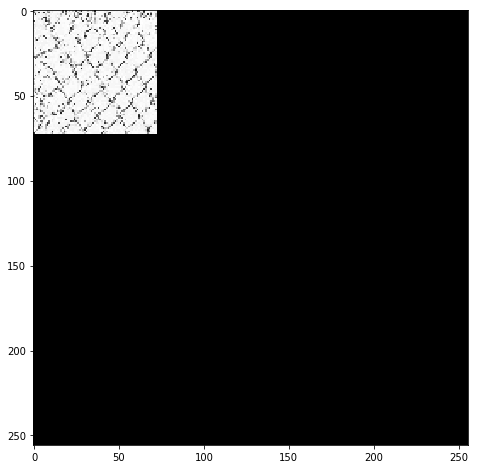

Iteration 73/256	Time: 20.177847147 seconds
Iteration 74/256	Time: 20.7118752003 seconds
Iteration 75/256	Time: 21.2698881626 seconds
Iteration 76/256	Time: 21.7849020958 seconds
Iteration 77/256	Time: 22.3152630329 seconds
Iteration 78/256	Time: 22.8561050892 seconds
Iteration 79/256	Time: 23.3591470718 seconds
Iteration 80/256	Time: 23.8492641449 seconds
Iteration 81/256	Time: 24.3728811741 seconds
Iteration 82/256	Time: 24.9359850883 seconds


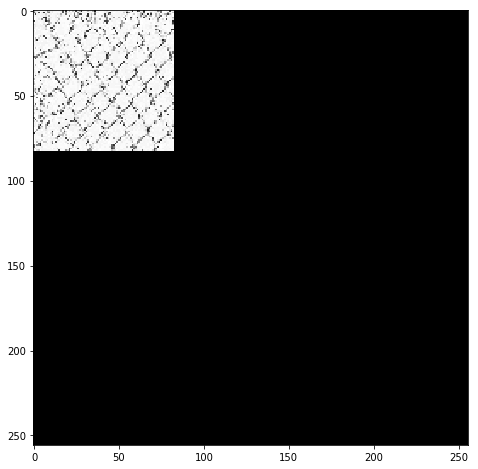

Iteration 83/256	Time: 25.6613731384 seconds
Iteration 84/256	Time: 26.2281281948 seconds
Iteration 85/256	Time: 26.7890422344 seconds
Iteration 86/256	Time: 27.3458721638 seconds
Iteration 87/256	Time: 27.9331400394 seconds
Iteration 88/256	Time: 28.5270590782 seconds
Iteration 89/256	Time: 29.1239991188 seconds
Iteration 90/256	Time: 29.7671010494 seconds
Iteration 91/256	Time: 30.3688502312 seconds
Iteration 92/256	Time: 30.9842741489 seconds


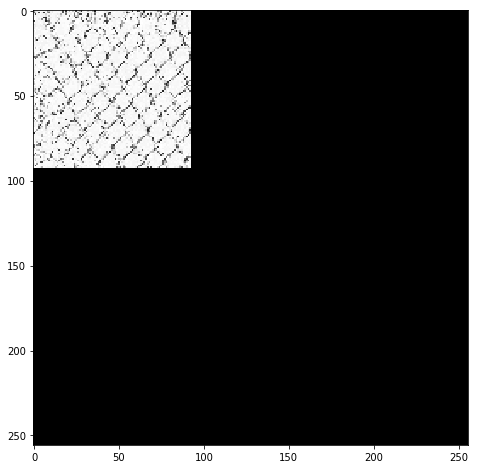

Iteration 93/256	Time: 31.7252650261 seconds
Iteration 94/256	Time: 32.3603231907 seconds
Iteration 95/256	Time: 32.9599711895 seconds
Iteration 96/256	Time: 33.6088731289 seconds
Iteration 97/256	Time: 34.2175002098 seconds
Iteration 98/256	Time: 34.8586280346 seconds
Iteration 99/256	Time: 35.4879691601 seconds
Iteration 100/256	Time: 36.1400010586 seconds
Iteration 101/256	Time: 36.7754321098 seconds
Iteration 102/256	Time: 37.4753751755 seconds


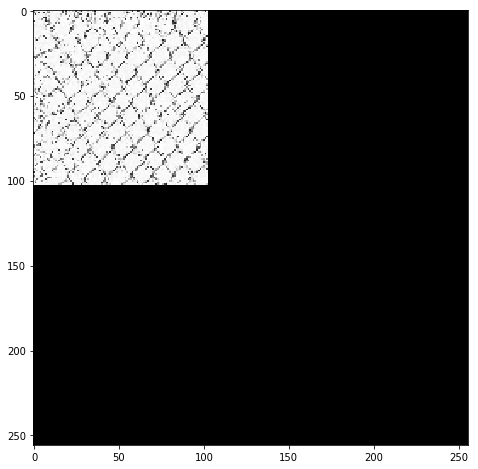

Iteration 103/256	Time: 38.3261802197 seconds
Iteration 104/256	Time: 39.0053720474 seconds
Iteration 105/256	Time: 39.6936061382 seconds
Iteration 106/256	Time: 40.3908030987 seconds
Iteration 107/256	Time: 41.0640602112 seconds
Iteration 108/256	Time: 41.7515392303 seconds
Iteration 109/256	Time: 42.4692451954 seconds
Iteration 110/256	Time: 43.2034840584 seconds
Iteration 111/256	Time: 43.9363081455 seconds
Iteration 112/256	Time: 44.6627311707 seconds


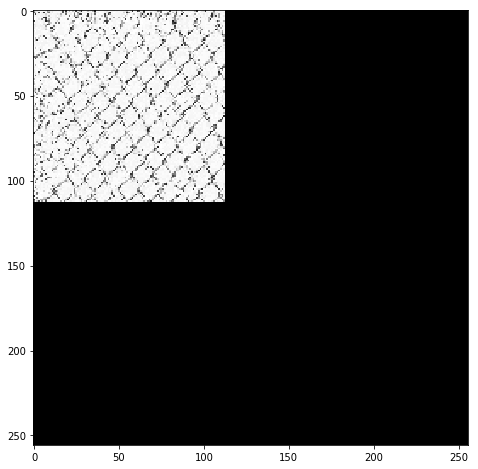

Iteration 113/256	Time: 45.5511641502 seconds
Iteration 114/256	Time: 46.3245370388 seconds
Iteration 115/256	Time: 47.0470991135 seconds
Iteration 116/256	Time: 47.751994133 seconds
Iteration 117/256	Time: 48.4903941154 seconds
Iteration 118/256	Time: 49.2608082294 seconds
Iteration 119/256	Time: 50.0413250923 seconds
Iteration 120/256	Time: 50.8008220196 seconds
Iteration 121/256	Time: 51.5455570221 seconds
Iteration 122/256	Time: 52.3072710037 seconds


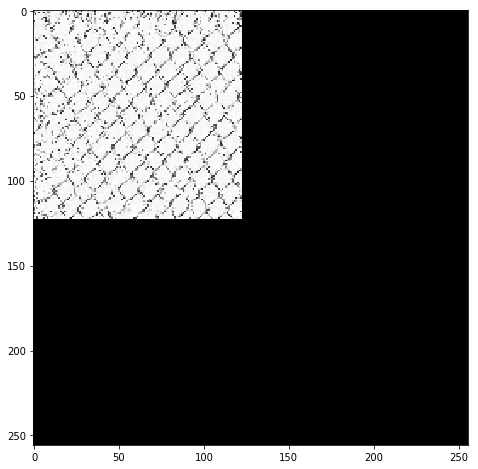

Iteration 123/256	Time: 53.2266640663 seconds
Iteration 124/256	Time: 54.0742681026 seconds
Iteration 125/256	Time: 54.8640630245 seconds
Iteration 126/256	Time: 55.6779592037 seconds
Iteration 127/256	Time: 56.5206182003 seconds
Iteration 128/256	Time: 57.3485791683 seconds
Iteration 129/256	Time: 58.192633152 seconds
Iteration 130/256	Time: 59.0623831749 seconds
Iteration 131/256	Time: 59.9283590317 seconds
Iteration 132/256	Time: 60.7476301193 seconds


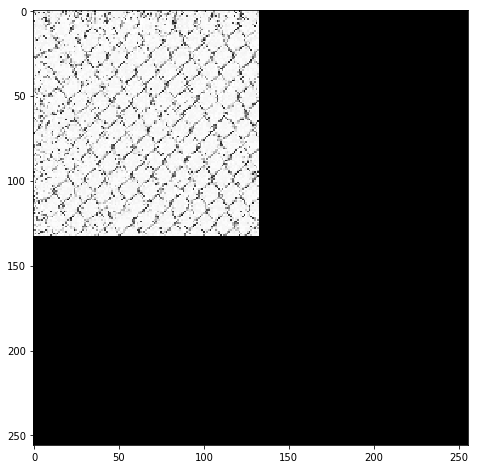

Iteration 133/256	Time: 61.731511116 seconds
Iteration 134/256	Time: 62.567690134 seconds
Iteration 135/256	Time: 63.3756921291 seconds
Iteration 136/256	Time: 64.2263212204 seconds
Iteration 137/256	Time: 65.0321650505 seconds
Iteration 138/256	Time: 65.8526101112 seconds
Iteration 139/256	Time: 66.6880660057 seconds
Iteration 140/256	Time: 67.5472280979 seconds
Iteration 141/256	Time: 68.4355521202 seconds
Iteration 142/256	Time: 69.4026470184 seconds


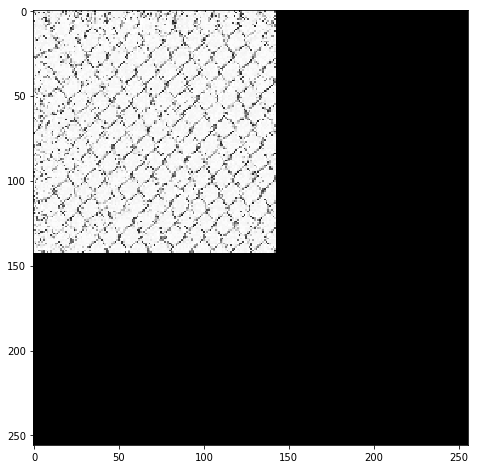

Iteration 143/256	Time: 70.4056460857 seconds
Iteration 144/256	Time: 71.3669571877 seconds
Iteration 145/256	Time: 72.2623741627 seconds
Iteration 146/256	Time: 73.1620061398 seconds
Iteration 147/256	Time: 74.1095631123 seconds
Iteration 148/256	Time: 75.0271201134 seconds
Iteration 149/256	Time: 75.9577782154 seconds
Iteration 150/256	Time: 76.8720622063 seconds
Iteration 151/256	Time: 77.7885081768 seconds
Iteration 152/256	Time: 78.7312581539 seconds


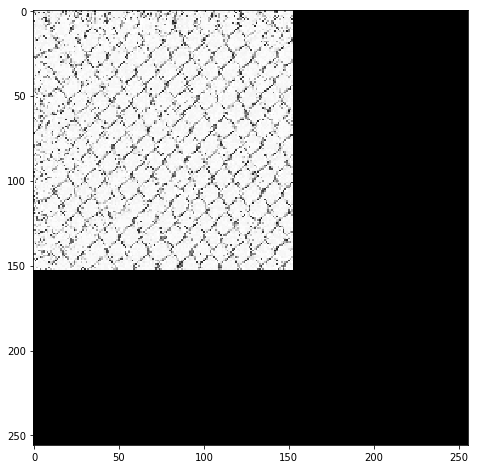

Iteration 153/256	Time: 79.8937721252 seconds
Iteration 154/256	Time: 80.8417441845 seconds
Iteration 155/256	Time: 81.8084011078 seconds
Iteration 156/256	Time: 82.7501661777 seconds
Iteration 157/256	Time: 83.7339651585 seconds
Iteration 158/256	Time: 84.7097451687 seconds
Iteration 159/256	Time: 85.7286131382 seconds
Iteration 160/256	Time: 86.68268013 seconds
Iteration 161/256	Time: 87.6769390106 seconds
Iteration 162/256	Time: 88.6971111298 seconds


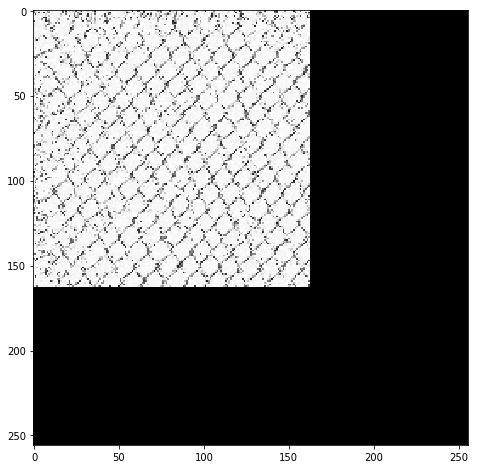

Iteration 163/256	Time: 89.8680481911 seconds
Iteration 164/256	Time: 90.8849730492 seconds
Iteration 165/256	Time: 91.9217391014 seconds
Iteration 166/256	Time: 92.9259281158 seconds
Iteration 167/256	Time: 93.9577651024 seconds
Iteration 168/256	Time: 95.0207870007 seconds
Iteration 169/256	Time: 96.0913619995 seconds
Iteration 170/256	Time: 97.1989061832 seconds
Iteration 171/256	Time: 98.2552130222 seconds
Iteration 172/256	Time: 99.3022470474 seconds


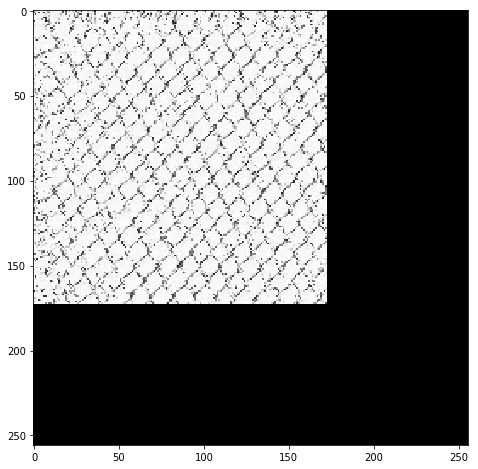

Iteration 173/256	Time: 100.56043601 seconds
Iteration 174/256	Time: 101.667103052 seconds
Iteration 175/256	Time: 102.731602192 seconds
Iteration 176/256	Time: 103.822902203 seconds
Iteration 177/256	Time: 104.877974033 seconds
Iteration 178/256	Time: 105.937474012 seconds
Iteration 179/256	Time: 107.039987087 seconds
Iteration 180/256	Time: 108.230322123 seconds
Iteration 181/256	Time: 109.383803129 seconds
Iteration 182/256	Time: 110.53898716 seconds


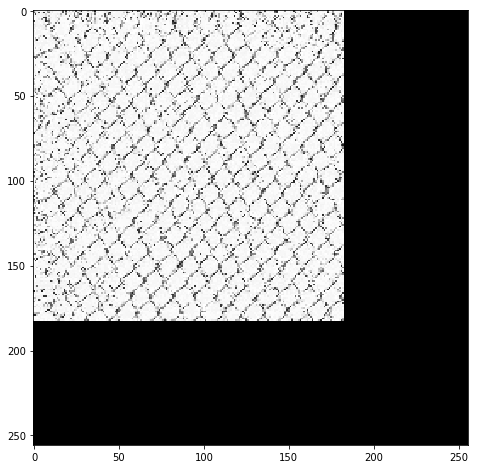

Iteration 183/256	Time: 111.873786211 seconds
Iteration 184/256	Time: 113.119608164 seconds
Iteration 185/256	Time: 114.299489021 seconds
Iteration 186/256	Time: 115.439226151 seconds
Iteration 187/256	Time: 116.628128052 seconds
Iteration 188/256	Time: 117.80479908 seconds
Iteration 189/256	Time: 118.93249917 seconds
Iteration 190/256	Time: 120.075002193 seconds
Iteration 191/256	Time: 121.182851076 seconds
Iteration 192/256	Time: 122.339496136 seconds


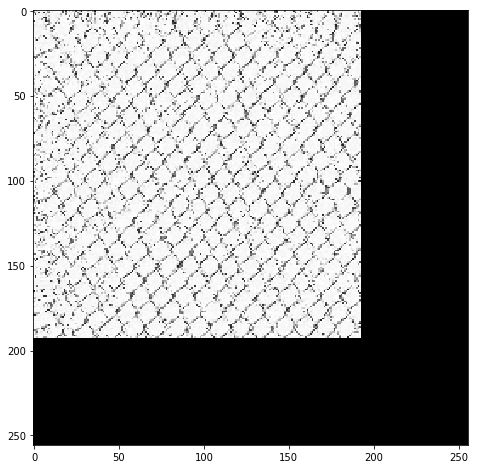

Iteration 193/256	Time: 123.666412115 seconds
Iteration 194/256	Time: 124.869760036 seconds
Iteration 195/256	Time: 126.069016218 seconds
Iteration 196/256	Time: 127.267453194 seconds
Iteration 197/256	Time: 128.454225063 seconds
Iteration 198/256	Time: 129.735758066 seconds
Iteration 199/256	Time: 131.015007019 seconds
Iteration 200/256	Time: 132.278680086 seconds
Iteration 201/256	Time: 133.494809151 seconds
Iteration 202/256	Time: 134.739205122 seconds


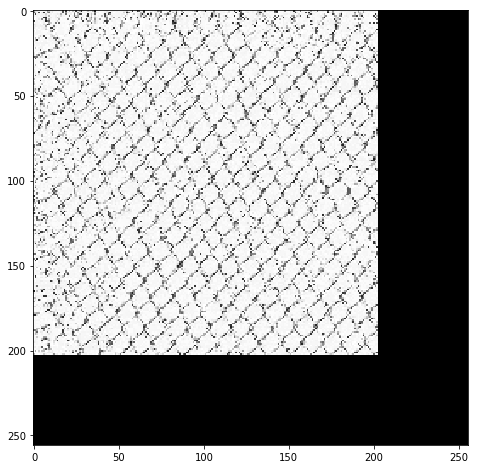

Iteration 203/256	Time: 136.194987059 seconds
Iteration 204/256	Time: 137.538593054 seconds
Iteration 205/256	Time: 138.836095095 seconds
Iteration 206/256	Time: 140.167707205 seconds
Iteration 207/256	Time: 141.456001043 seconds
Iteration 208/256	Time: 142.744729042 seconds
Iteration 209/256	Time: 144.014310122 seconds
Iteration 210/256	Time: 145.349953175 seconds
Iteration 211/256	Time: 146.656371117 seconds
Iteration 212/256	Time: 147.986238003 seconds


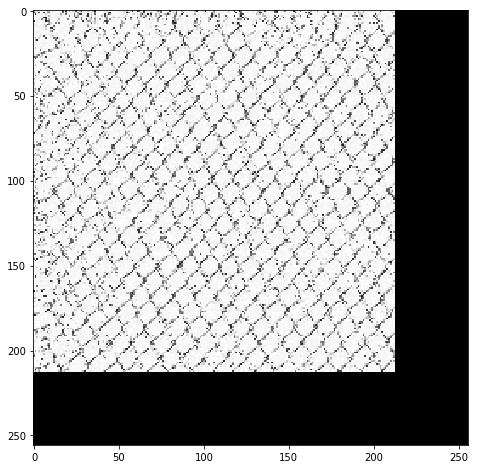

Iteration 213/256	Time: 149.462723017 seconds
Iteration 214/256	Time: 150.803704023 seconds
Iteration 215/256	Time: 152.109823227 seconds
Iteration 216/256	Time: 153.423353195 seconds
Iteration 217/256	Time: 154.762957096 seconds
Iteration 218/256	Time: 156.026260138 seconds
Iteration 219/256	Time: 157.356898069 seconds
Iteration 220/256	Time: 158.654025078 seconds
Iteration 221/256	Time: 159.98895216 seconds
Iteration 222/256	Time: 161.305980206 seconds


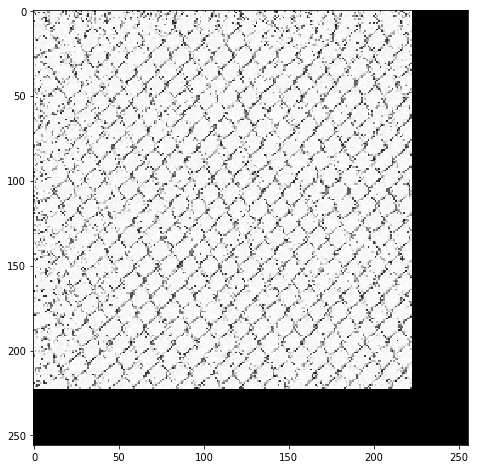

Iteration 223/256	Time: 162.861034155 seconds
Iteration 224/256	Time: 164.324180126 seconds
Iteration 225/256	Time: 165.762925148 seconds
Iteration 226/256	Time: 167.178397179 seconds
Iteration 227/256	Time: 168.60129714 seconds
Iteration 228/256	Time: 170.038141012 seconds
Iteration 229/256	Time: 171.478921175 seconds
Iteration 230/256	Time: 172.885295153 seconds
Iteration 231/256	Time: 174.285591125 seconds
Iteration 232/256	Time: 175.699902058 seconds


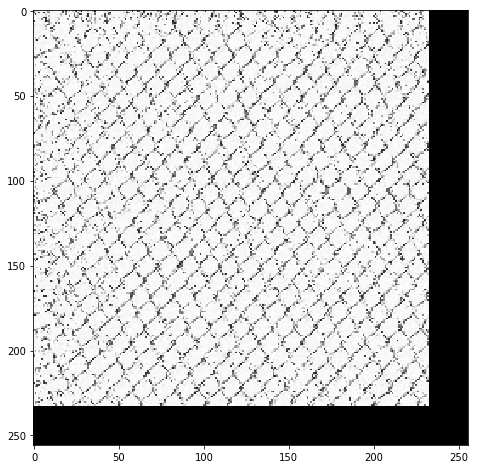

Iteration 233/256	Time: 177.354004145 seconds
Iteration 234/256	Time: 178.839575052 seconds
Iteration 235/256	Time: 180.274355173 seconds
Iteration 236/256	Time: 181.726514101 seconds
Iteration 237/256	Time: 183.157431126 seconds
Iteration 238/256	Time: 184.638413191 seconds
Iteration 239/256	Time: 186.027304173 seconds
Iteration 240/256	Time: 187.467787027 seconds
Iteration 241/256	Time: 188.87996316 seconds
Iteration 242/256	Time: 190.315932035 seconds


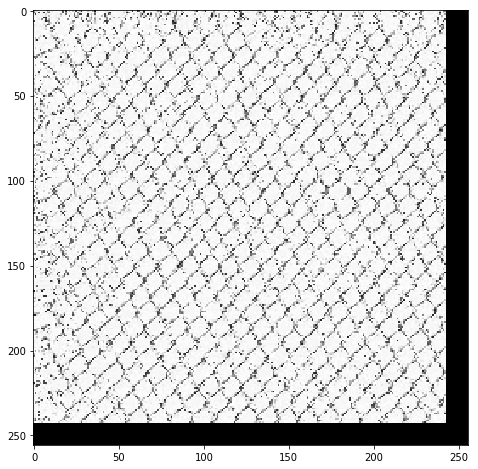

Iteration 243/256	Time: 191.924361229 seconds
Iteration 244/256	Time: 193.367582083 seconds
Iteration 245/256	Time: 194.866993189 seconds
Iteration 246/256	Time: 196.336596012 seconds
Iteration 247/256	Time: 198.11544013 seconds
Iteration 248/256	Time: 200.095599174 seconds
Iteration 249/256	Time: 201.866541147 seconds
Iteration 250/256	Time: 203.81717205 seconds
Iteration 251/256	Time: 205.9751091 seconds
Iteration 252/256	Time: 208.202297211 seconds


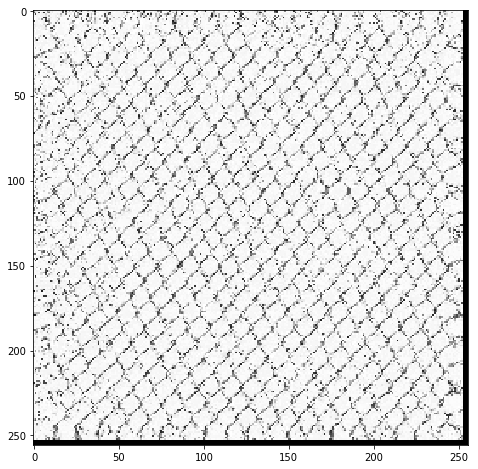

Iteration 253/256	Time: 210.686704159 seconds
Iteration 254/256	Time: 213.195937157 seconds
Iteration 255/256	Time: 215.664945126 seconds
('Total Time: ', 218.27035903930664, ' seconds')


In [ ]:
texture_synthesize("fence.jpg", "out_fence.png", final_size_x=256, final_size_y=256, \
                   kernel_size=21,resize_factor=64)


Iteration 3/256	Time: 0.000180959701538 seconds
Iteration 4/256	Time: 0.403852939606 seconds
Iteration 5/256	Time: 0.903945922852 seconds
Iteration 6/256	Time: 1.48522377014 seconds
Iteration 7/256	Time: 2.15743088722 seconds
Iteration 8/256	Time: 3.12128376961 seconds
Iteration 9/256	Time: 3.9383919239 seconds
Iteration 10/256	Time: 4.86408185959 seconds
Iteration 11/256	Time: 5.86248397827 seconds
Iteration 12/256	Time: 6.94380998611 seconds


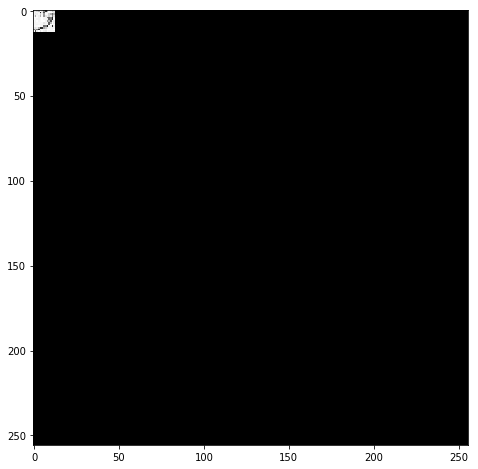

Iteration 13/256	Time: 8.34748196602 seconds
Iteration 14/256	Time: 9.64732193947 seconds
Iteration 15/256	Time: 10.9764437675 seconds
Iteration 16/256	Time: 12.4011487961 seconds
Iteration 17/256	Time: 13.9903798103 seconds
Iteration 18/256	Time: 15.6461730003 seconds
Iteration 19/256	Time: 17.3193838596 seconds
Iteration 20/256	Time: 19.1232209206 seconds
Iteration 21/256	Time: 20.9881329536 seconds
Iteration 22/256	Time: 22.9591329098 seconds


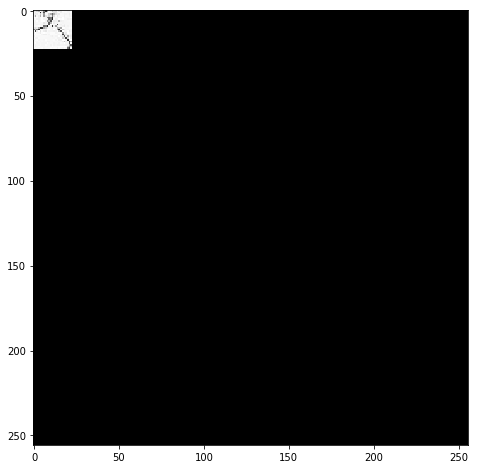

Iteration 23/256	Time: 25.1012327671 seconds
Iteration 24/256	Time: 27.2164459229 seconds
Iteration 25/256	Time: 29.4124448299 seconds
Iteration 26/256	Time: 31.7575788498 seconds
Iteration 27/256	Time: 34.2171387672 seconds
Iteration 28/256	Time: 36.7023367882 seconds
Iteration 29/256	Time: 39.2718298435 seconds
Iteration 30/256	Time: 41.9455659389 seconds
Iteration 31/256	Time: 44.733702898 seconds
Iteration 32/256	Time: 47.5423998833 seconds


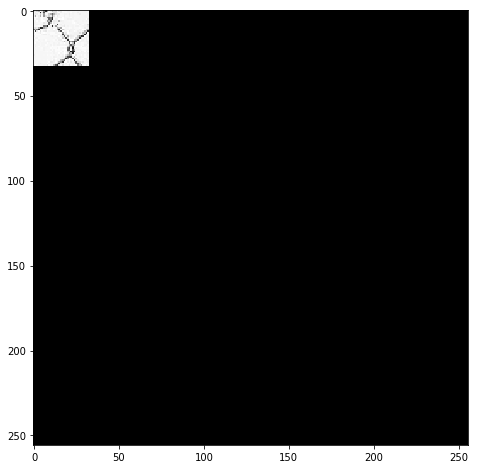

Iteration 33/256	Time: 50.58629179 seconds
Iteration 34/256	Time: 53.5073587894 seconds
Iteration 35/256	Time: 56.4881808758 seconds
Iteration 36/256	Time: 59.6716179848 seconds
Iteration 37/256	Time: 62.892428875 seconds
Iteration 38/256	Time: 66.2001399994 seconds
Iteration 39/256	Time: 69.5818908215 seconds
Iteration 40/256	Time: 73.0815718174 seconds
Iteration 41/256	Time: 76.6514098644 seconds
Iteration 42/256	Time: 80.3298158646 seconds


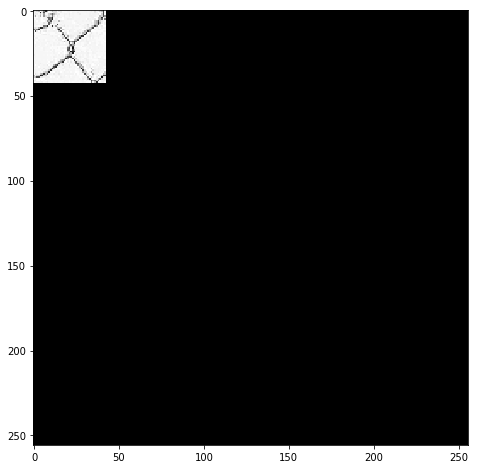

Iteration 43/256	Time: 84.1753678322 seconds
Iteration 44/256	Time: 87.9816138744 seconds
Iteration 45/256	Time: 91.9282138348 seconds
Iteration 46/256	Time: 96.0546457767 seconds
Iteration 47/256	Time: 100.218441963 seconds
Iteration 48/256	Time: 104.434694767 seconds
Iteration 49/256	Time: 108.74207592 seconds
Iteration 50/256	Time: 113.138047934 seconds
Iteration 51/256	Time: 117.581314802 seconds
Iteration 52/256	Time: 122.112402916 seconds


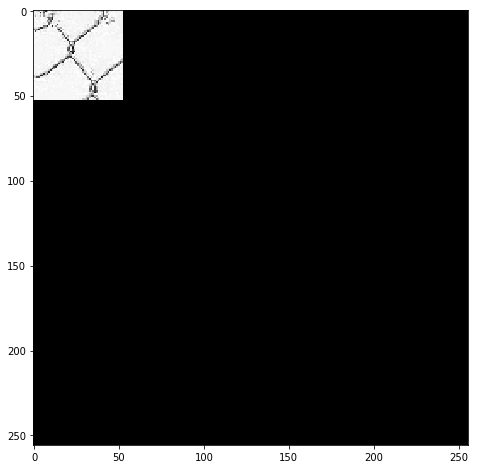

Iteration 53/256	Time: 126.863192797 seconds
Iteration 54/256	Time: 131.57974577 seconds
Iteration 55/256	Time: 136.395760775 seconds
Iteration 56/256	Time: 141.367968798 seconds
Iteration 57/256	Time: 146.311876774 seconds
Iteration 58/256	Time: 151.332541943 seconds
Iteration 59/256	Time: 156.54547286 seconds
Iteration 60/256	Time: 161.862626791 seconds
Iteration 61/256	Time: 167.175260782 seconds
Iteration 62/256	Time: 172.5717628 seconds


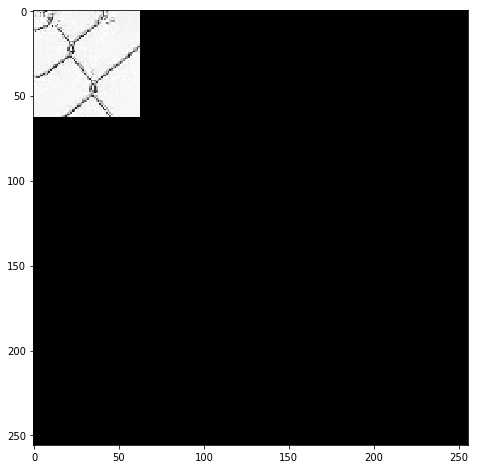

Iteration 63/256	Time: 178.208666801 seconds
Iteration 64/256	Time: 183.713475943 seconds
Iteration 65/256	Time: 189.401305914 seconds
Iteration 66/256	Time: 195.217575788 seconds
Iteration 67/256	Time: 201.083680868 seconds
Iteration 68/256	Time: 206.97633481 seconds
Iteration 69/256	Time: 212.968867779 seconds
Iteration 70/256	Time: 219.156205893 seconds
Iteration 71/256	Time: 225.239768982 seconds
Iteration 72/256	Time: 231.399619818 seconds


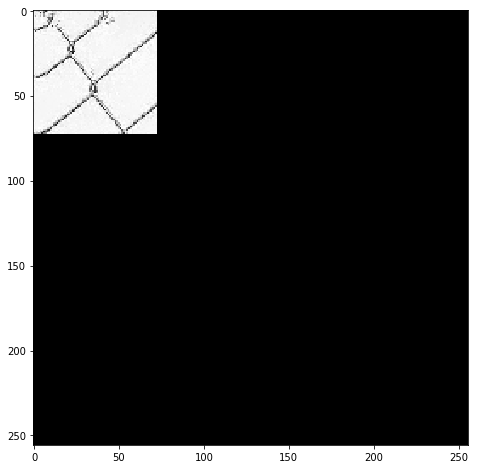

Iteration 73/256	Time: 237.870942831 seconds
Iteration 74/256	Time: 244.38852787 seconds
Iteration 75/256	Time: 250.994717836 seconds
Iteration 76/256	Time: 257.762496948 seconds
Iteration 77/256	Time: 264.612257957 seconds
Iteration 78/256	Time: 271.5278759 seconds
Iteration 79/256	Time: 278.466270924 seconds
Iteration 80/256	Time: 285.432204962 seconds
Iteration 81/256	Time: 292.539554834 seconds
Iteration 82/256	Time: 299.778179884 seconds


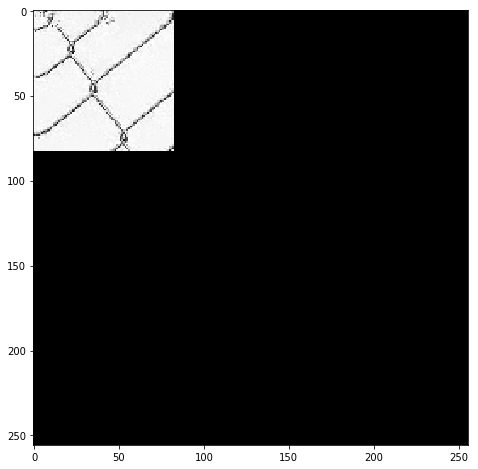

Iteration 83/256	Time: 307.211828947 seconds
Iteration 84/256	Time: 314.560553789 seconds
Iteration 85/256	Time: 321.900087833 seconds
Iteration 86/256	Time: 329.352711916 seconds
Iteration 87/256	Time: 336.972224951 seconds
Iteration 88/256	Time: 344.579536915 seconds
Iteration 89/256	Time: 352.235858917 seconds
Iteration 90/256	Time: 360.115827799 seconds
Iteration 91/256	Time: 368.02113986 seconds
Iteration 92/256	Time: 375.953574896 seconds


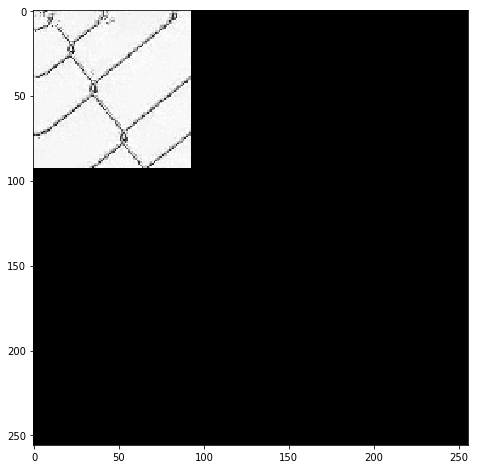

Iteration 93/256	Time: 384.157444954 seconds
Iteration 94/256	Time: 392.455710888 seconds
Iteration 95/256	Time: 400.668220997 seconds
Iteration 96/256	Time: 408.997209787 seconds
Iteration 97/256	Time: 417.410296917 seconds
Iteration 98/256	Time: 426.011159897 seconds
Iteration 99/256	Time: 434.937593937 seconds
Iteration 100/256	Time: 443.841589928 seconds
Iteration 101/256	Time: 452.757531881 seconds
Iteration 102/256	Time: 461.683934927 seconds


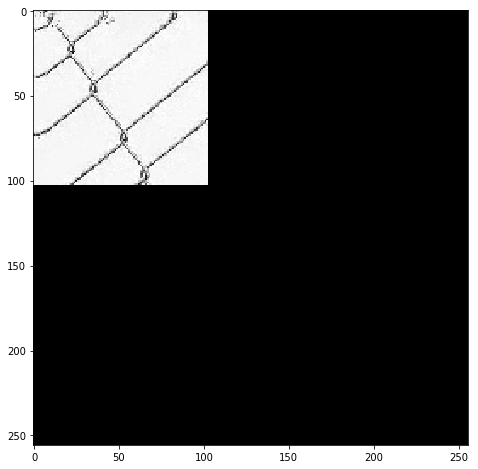

Iteration 103/256	Time: 471.03390193 seconds
Iteration 104/256	Time: 479.979990959 seconds
Iteration 105/256	Time: 489.092229843 seconds
Iteration 106/256	Time: 498.251417875 seconds
Iteration 107/256	Time: 507.719742775 seconds
Iteration 108/256	Time: 517.135979891 seconds
Iteration 109/256	Time: 526.574712992 seconds
Iteration 110/256	Time: 536.173173904 seconds
Iteration 111/256	Time: 545.905170918 seconds
Iteration 112/256	Time: 555.668847799 seconds


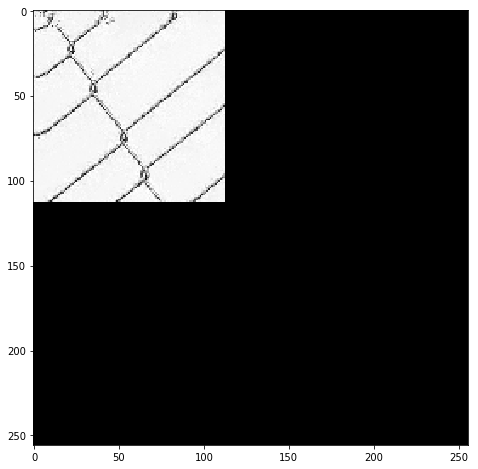

Iteration 113/256	Time: 565.940461874 seconds
Iteration 114/256	Time: 575.934575796 seconds
Iteration 115/256	Time: 585.978473902 seconds
Iteration 116/256	Time: 596.499608994 seconds
Iteration 117/256	Time: 606.689450979 seconds
Iteration 118/256	Time: 616.913614988 seconds
Iteration 119/256	Time: 627.759564877 seconds
Iteration 120/256	Time: 638.247759819 seconds
Iteration 121/256	Time: 648.784100771 seconds
Iteration 122/256	Time: 659.748437881 seconds


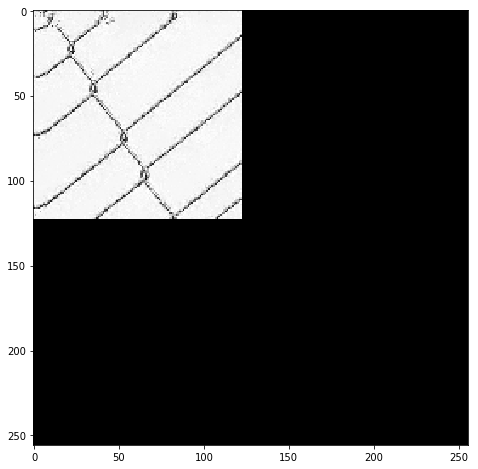

Iteration 123/256	Time: 670.750705957 seconds
Iteration 124/256	Time: 681.728008986 seconds
Iteration 125/256	Time: 692.882627964 seconds
Iteration 126/256	Time: 703.884916782 seconds
Iteration 127/256	Time: 715.02063489 seconds
Iteration 128/256	Time: 726.534046888 seconds
Iteration 129/256	Time: 737.711218834 seconds
Iteration 130/256	Time: 748.96666193 seconds
Iteration 131/256	Time: 760.669684887 seconds
Iteration 132/256	Time: 772.165797949 seconds


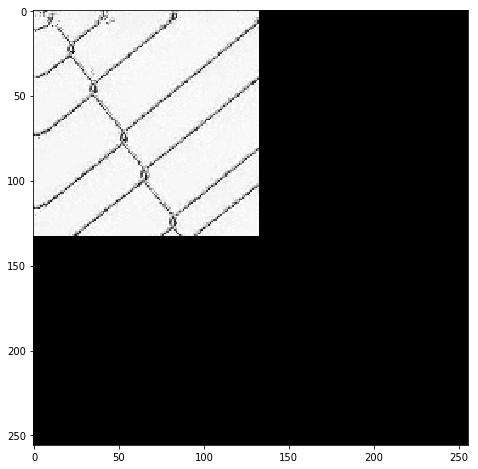

Iteration 133/256	Time: 784.226846933 seconds
Iteration 134/256	Time: 795.879301786 seconds
Iteration 135/256	Time: 807.468059778 seconds
Iteration 136/256	Time: 819.660660982 seconds
Iteration 137/256	Time: 831.572195768 seconds
Iteration 138/256	Time: 843.539213896 seconds
Iteration 139/256	Time: 855.704596996 seconds
Iteration 140/256	Time: 867.906714916 seconds
Iteration 141/256	Time: 880.080755949 seconds
Iteration 142/256	Time: 892.274518967 seconds


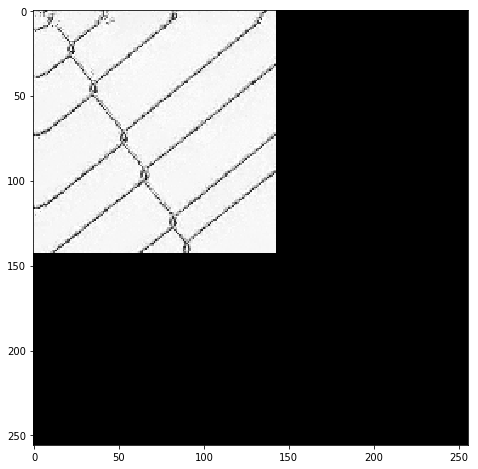

Iteration 143/256	Time: 904.505025864 seconds
Iteration 144/256	Time: 916.92728591 seconds
Iteration 145/256	Time: 929.200193882 seconds
Iteration 146/256	Time: 941.580333948 seconds
Iteration 147/256	Time: 954.108069897 seconds
Iteration 148/256	Time: 966.581843853 seconds
Iteration 149/256	Time: 979.33362484 seconds
Iteration 150/256	Time: 992.188537836 seconds
Iteration 151/256	Time: 1004.98119283 seconds
Iteration 152/256	Time: 1017.74144197 seconds


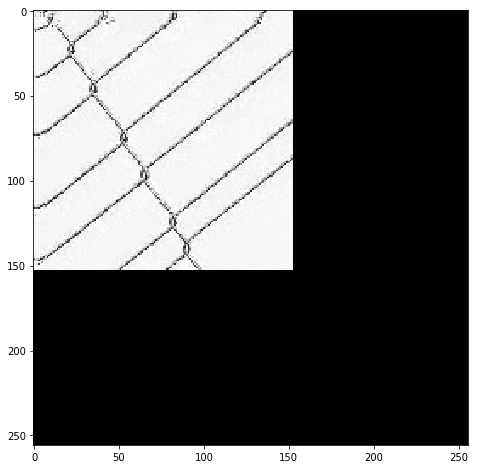

Iteration 153/256	Time: 1030.97434998 seconds
Iteration 154/256	Time: 1044.19539285 seconds
Iteration 155/256	Time: 1057.42957592 seconds
Iteration 156/256	Time: 1070.86550283 seconds
Iteration 157/256	Time: 1084.30529284 seconds
Iteration 158/256	Time: 1097.82121587 seconds
Iteration 159/256	Time: 1111.46066689 seconds
Iteration 160/256	Time: 1125.17472196 seconds
Iteration 161/256	Time: 1138.96410179 seconds
Iteration 162/256	Time: 1153.19113684 seconds


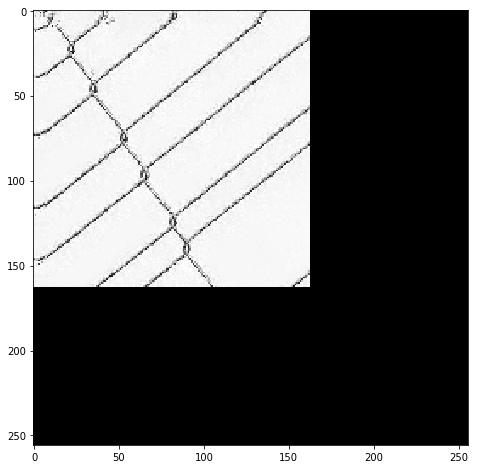

Iteration 163/256	Time: 1167.46862197 seconds
Iteration 164/256	Time: 1181.78861189 seconds
Iteration 165/256	Time: 1196.09747195 seconds
Iteration 166/256	Time: 1210.65496492 seconds
Iteration 167/256	Time: 1225.34647298 seconds
Iteration 168/256	Time: 1239.80271792 seconds
Iteration 169/256	Time: 1254.25247478 seconds
Iteration 170/256	Time: 1268.99454999 seconds
Iteration 171/256	Time: 1283.78955483 seconds
Iteration 172/256	Time: 1298.51576185 seconds


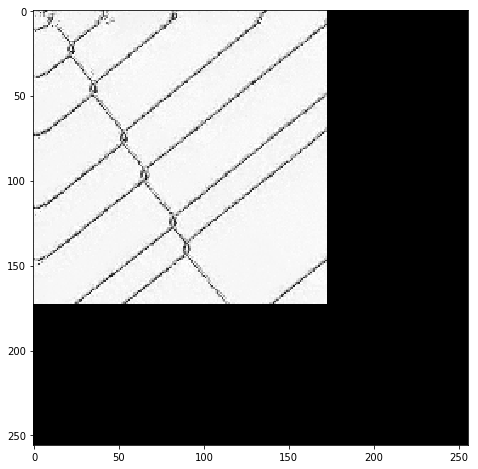

Iteration 173/256	Time: 1313.6664319 seconds
Iteration 174/256	Time: 1328.8549788 seconds
Iteration 175/256	Time: 1343.97640085 seconds
Iteration 176/256	Time: 1359.30407691 seconds
Iteration 177/256	Time: 1374.74024487 seconds
Iteration 178/256	Time: 1390.23025179 seconds
Iteration 179/256	Time: 1406.01904082 seconds
Iteration 180/256	Time: 1421.52566099 seconds
Iteration 181/256	Time: 1437.08562183 seconds
Iteration 182/256	Time: 1452.80964494 seconds


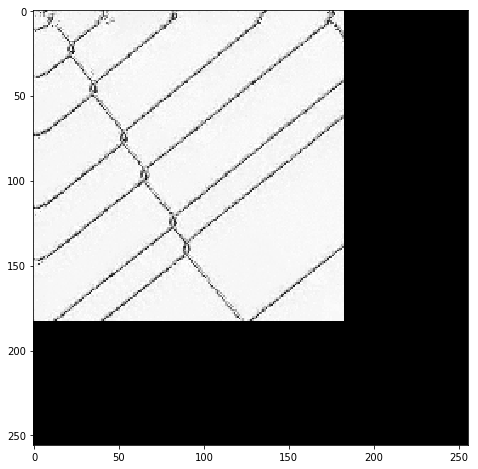

Iteration 183/256	Time: 1468.87338495 seconds
Iteration 184/256	Time: 1484.94258785 seconds
Iteration 185/256	Time: 1500.98609495 seconds
Iteration 186/256	Time: 1517.40897179 seconds
Iteration 187/256	Time: 1533.52991796 seconds
Iteration 188/256	Time: 1549.97815681 seconds
Iteration 189/256	Time: 1566.33948898 seconds
Iteration 190/256	Time: 1582.85820699 seconds
Iteration 191/256	Time: 1599.42068791 seconds
Iteration 192/256	Time: 1616.1679759 seconds


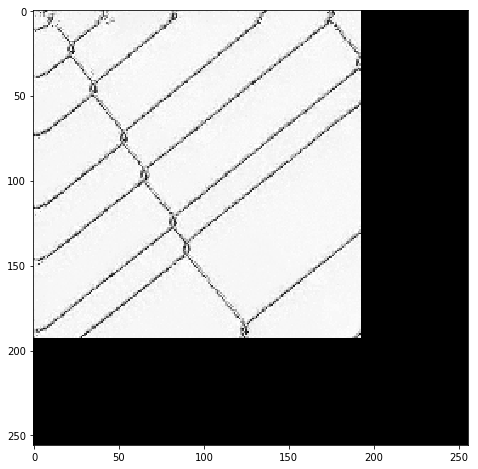

Iteration 193/256	Time: 1633.07389092 seconds
Iteration 194/256	Time: 1650.12127185 seconds
Iteration 195/256	Time: 1667.16974187 seconds
Iteration 196/256	Time: 1684.33808184 seconds
Iteration 197/256	Time: 1701.59867096 seconds
Iteration 198/256	Time: 1718.93185592 seconds
Iteration 199/256	Time: 1736.23767996 seconds
Iteration 200/256	Time: 1753.7423439 seconds
Iteration 201/256	Time: 1771.14203882 seconds
Iteration 202/256	Time: 1788.879426 seconds


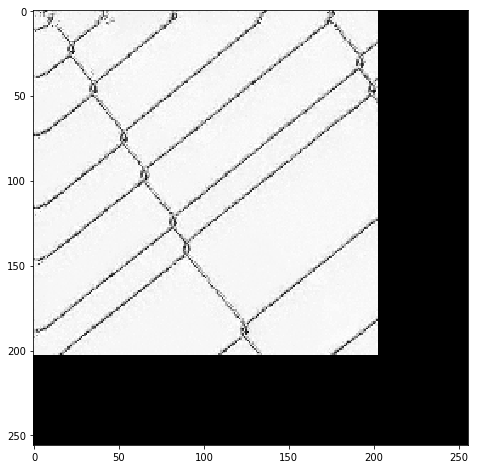

Iteration 203/256	Time: 1806.95848894 seconds
Iteration 204/256	Time: 1824.66155577 seconds
Iteration 205/256	Time: 1842.53096986 seconds
Iteration 206/256	Time: 1860.34952688 seconds
Iteration 207/256	Time: 1878.44446778 seconds
Iteration 208/256	Time: 1896.68591285 seconds
Iteration 209/256	Time: 1914.7481029 seconds
Iteration 210/256	Time: 1932.773453 seconds
Iteration 211/256	Time: 1951.11458182 seconds
Iteration 212/256	Time: 1969.37372494 seconds


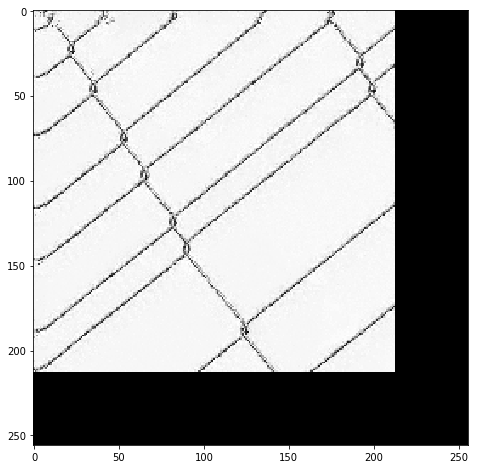

Iteration 213/256	Time: 1987.82484698 seconds
Iteration 214/256	Time: 2006.56611586 seconds
Iteration 215/256	Time: 2025.23937488 seconds
Iteration 216/256	Time: 2044.01001382 seconds
Iteration 217/256	Time: 2062.82379794 seconds
Iteration 218/256	Time: 2081.72177696 seconds
Iteration 219/256	Time: 2100.679281 seconds
Iteration 220/256	Time: 2119.76201987 seconds
Iteration 221/256	Time: 2138.80341196 seconds
Iteration 222/256	Time: 2157.88096786 seconds


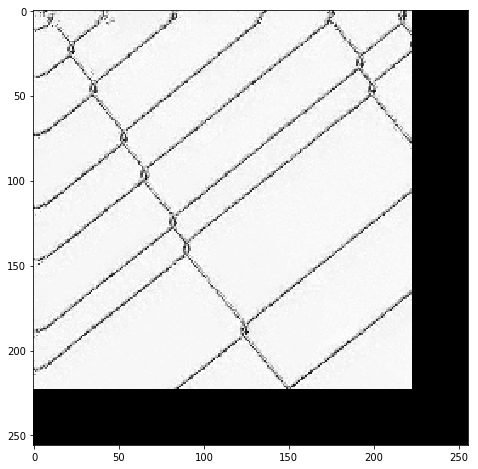

Iteration 223/256	Time: 2177.39696598 seconds


In [ ]:
texture_synthesize("fence.jpg", "out_fence_128.png", final_size_x=256, final_size_y=256, \
                   kernel_size=16,resize_factor=128)


Iteration 3/256	Time: 0.000189065933228 seconds
Iteration 4/256	Time: 0.377603054047 seconds
Iteration 5/256	Time: 0.836604118347 seconds
Iteration 6/256	Time: 1.36942815781 seconds
Iteration 7/256	Time: 2.00321507454 seconds
Iteration 8/256	Time: 2.6803791523 seconds
Iteration 9/256	Time: 3.43740200996 seconds
Iteration 10/256	Time: 4.2812230587 seconds
Iteration 11/256	Time: 5.16394305229 seconds
Iteration 12/256	Time: 6.13510799408 seconds


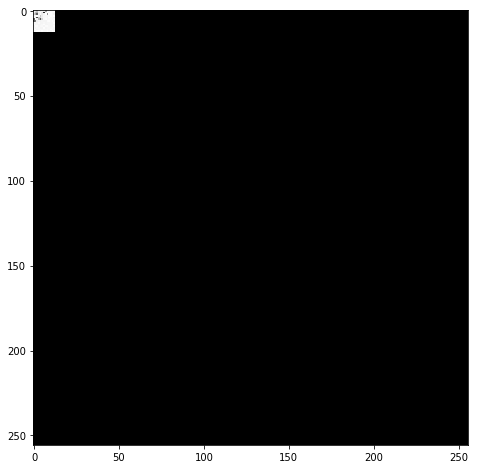

Iteration 13/256	Time: 7.30596494675 seconds
Iteration 14/256	Time: 8.42169499397 seconds
Iteration 15/256	Time: 9.65425896645 seconds
Iteration 16/256	Time: 10.9079661369 seconds
Iteration 17/256	Time: 12.1941270828 seconds
Iteration 18/256	Time: 13.5743660927 seconds
Iteration 19/256	Time: 15.0067250729 seconds
Iteration 20/256	Time: 16.5605890751 seconds
Iteration 21/256	Time: 18.1549961567 seconds
Iteration 22/256	Time: 19.8567931652 seconds


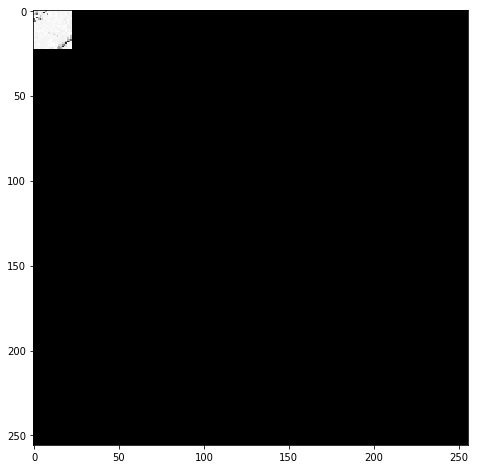

Iteration 23/256	Time: 21.7321879864 seconds
Iteration 24/256	Time: 23.612349987 seconds
Iteration 25/256	Time: 25.6141741276 seconds
Iteration 26/256	Time: 27.5868151188 seconds
Iteration 27/256	Time: 29.7198960781 seconds
Iteration 28/256	Time: 31.8779780865 seconds
Iteration 29/256	Time: 34.110806942 seconds
Iteration 30/256	Time: 36.3640990257 seconds
Iteration 31/256	Time: 38.6891291142 seconds
Iteration 32/256	Time: 41.101883173 seconds


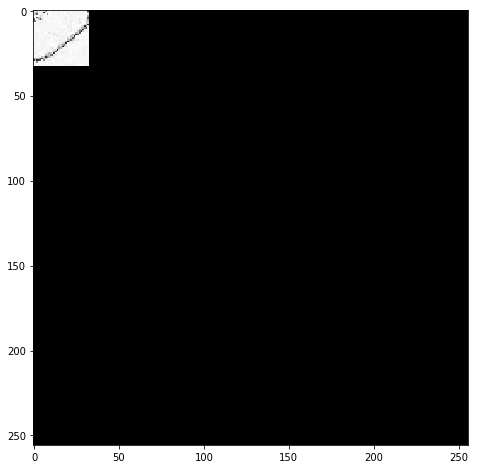

Iteration 33/256	Time: 43.6933140755 seconds
Iteration 34/256	Time: 46.2193379402 seconds
Iteration 35/256	Time: 48.8891460896 seconds
Iteration 36/256	Time: 51.5075409412 seconds
Iteration 37/256	Time: 54.288038969 seconds
Iteration 38/256	Time: 57.1171331406 seconds
Iteration 39/256	Time: 60.0254089832 seconds
Iteration 40/256	Time: 62.9928059578 seconds
Iteration 41/256	Time: 66.0049540997 seconds
Iteration 42/256	Time: 69.100924015 seconds


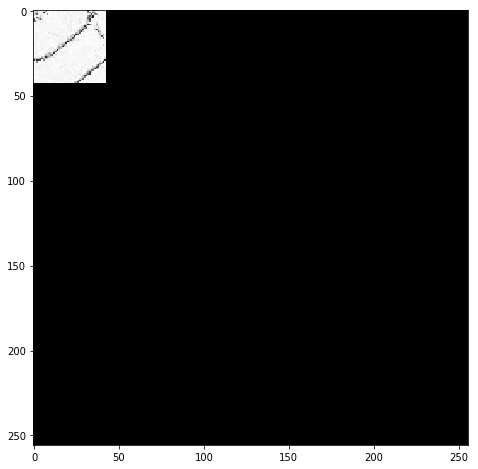

Iteration 43/256	Time: 72.4864621162 seconds
Iteration 44/256	Time: 75.759770155 seconds
Iteration 45/256	Time: 79.1195700169 seconds
Iteration 46/256	Time: 82.5337440968 seconds
Iteration 47/256	Time: 85.9997961521 seconds
Iteration 48/256	Time: 89.598637104 seconds
Iteration 49/256	Time: 93.195125103 seconds
Iteration 50/256	Time: 96.9517519474 seconds
Iteration 51/256	Time: 100.749854088 seconds
Iteration 52/256	Time: 104.563038111 seconds


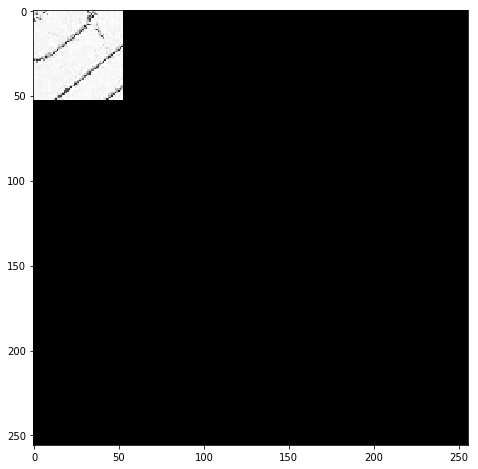

Iteration 53/256	Time: 108.674090147 seconds
Iteration 54/256	Time: 112.658847094 seconds
Iteration 55/256	Time: 116.771744967 seconds
Iteration 56/256	Time: 120.875405073 seconds
Iteration 57/256	Time: 125.065061092 seconds
Iteration 58/256	Time: 129.361578941 seconds
Iteration 59/256	Time: 133.754204035 seconds
Iteration 60/256	Time: 138.058951139 seconds
Iteration 61/256	Time: 142.524460077 seconds
Iteration 62/256	Time: 147.089766979 seconds


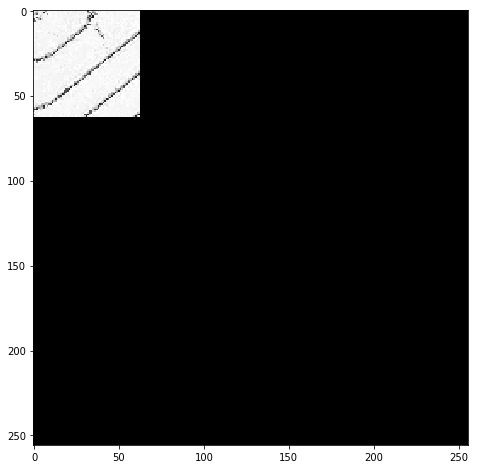

Iteration 63/256	Time: 152.003921032 seconds
Iteration 64/256	Time: 156.864315033 seconds
Iteration 65/256	Time: 161.571809053 seconds
Iteration 66/256	Time: 166.429072142 seconds
Iteration 67/256	Time: 171.371176004 seconds
Iteration 68/256	Time: 176.284872055 seconds
Iteration 69/256	Time: 181.306301117 seconds
Iteration 70/256	Time: 186.419377089 seconds
Iteration 71/256	Time: 191.665256023 seconds
Iteration 72/256	Time: 196.999992132 seconds


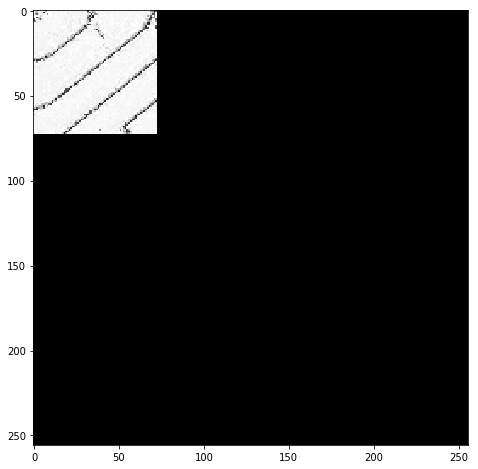

Iteration 73/256	Time: 202.542544127 seconds
Iteration 74/256	Time: 207.870265961 seconds
Iteration 75/256	Time: 213.459434032 seconds
Iteration 76/256	Time: 218.989288092 seconds
Iteration 77/256	Time: 224.542488098 seconds
Iteration 78/256	Time: 230.232294083 seconds
Iteration 79/256	Time: 236.010933161 seconds
Iteration 80/256	Time: 241.862159014 seconds
Iteration 81/256	Time: 247.673020124 seconds
Iteration 82/256	Time: 253.55516696 seconds


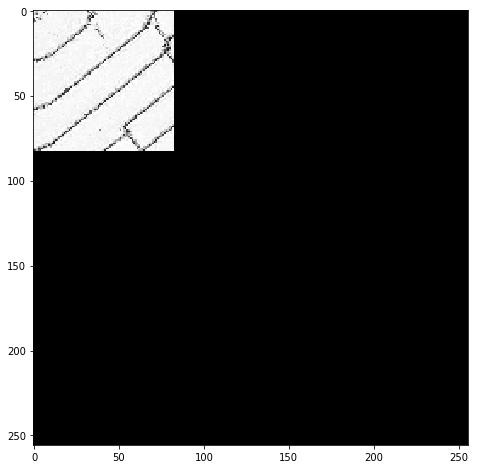

Iteration 83/256	Time: 259.765377045 seconds
Iteration 84/256	Time: 265.858155966 seconds
Iteration 85/256	Time: 272.217911005 seconds
Iteration 86/256	Time: 278.511300087 seconds
Iteration 87/256	Time: 284.869421959 seconds
Iteration 88/256	Time: 291.356165171 seconds
Iteration 89/256	Time: 297.91733408 seconds
Iteration 90/256	Time: 304.451717138 seconds
Iteration 91/256	Time: 311.145581961 seconds
Iteration 92/256	Time: 317.791039944 seconds


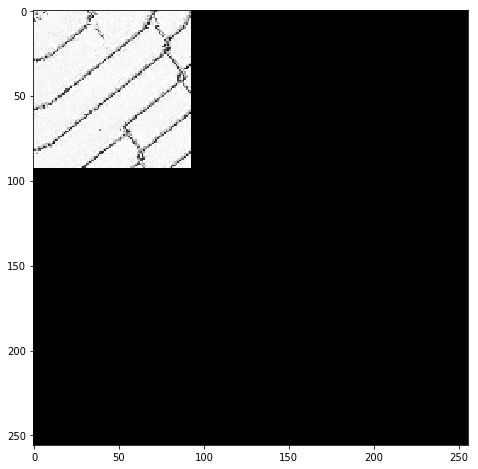

Iteration 93/256	Time: 324.706355095 seconds
Iteration 94/256	Time: 331.73043704 seconds
Iteration 95/256	Time: 338.697250128 seconds
Iteration 96/256	Time: 345.789770126 seconds
Iteration 97/256	Time: 353.034243107 seconds
Iteration 98/256	Time: 360.261198044 seconds
Iteration 99/256	Time: 367.699972153 seconds
Iteration 100/256	Time: 375.264690161 seconds
Iteration 101/256	Time: 382.603085995 seconds
Iteration 102/256	Time: 390.108153105 seconds


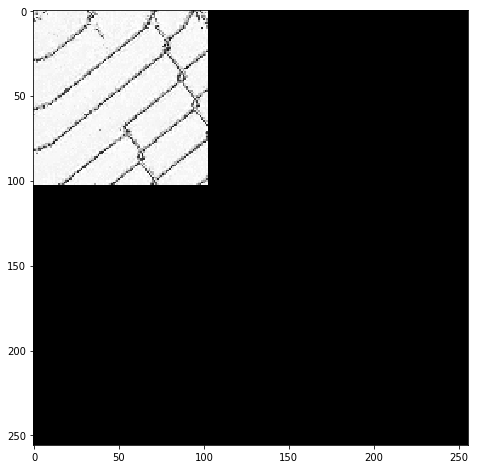

Iteration 103/256	Time: 398.031315088 seconds
Iteration 104/256	Time: 405.606917143 seconds
Iteration 105/256	Time: 413.231400967 seconds
Iteration 106/256	Time: 420.818935156 seconds
Iteration 107/256	Time: 428.669237137 seconds
Iteration 108/256	Time: 436.436531067 seconds
Iteration 109/256	Time: 444.305142164 seconds
Iteration 110/256	Time: 452.386310101 seconds
Iteration 111/256	Time: 460.568367004 seconds
Iteration 112/256	Time: 468.704761982 seconds


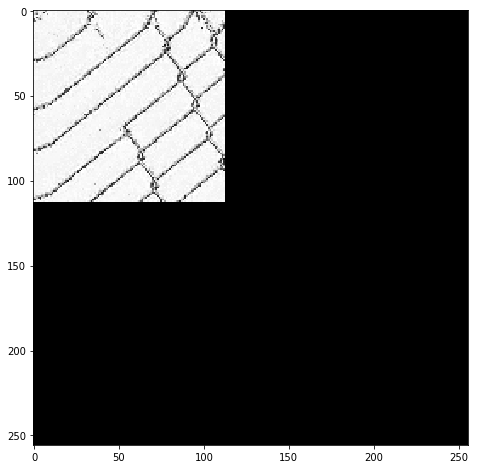

Iteration 113/256	Time: 477.097357988 seconds
Iteration 114/256	Time: 485.687275171 seconds
Iteration 115/256	Time: 494.134443998 seconds
Iteration 116/256	Time: 502.689061165 seconds
Iteration 117/256	Time: 511.32021904 seconds
Iteration 118/256	Time: 520.109389067 seconds
Iteration 119/256	Time: 529.023635149 seconds
Iteration 120/256	Time: 538.264126062 seconds
Iteration 121/256	Time: 547.194609165 seconds
Iteration 122/256	Time: 556.261351109 seconds


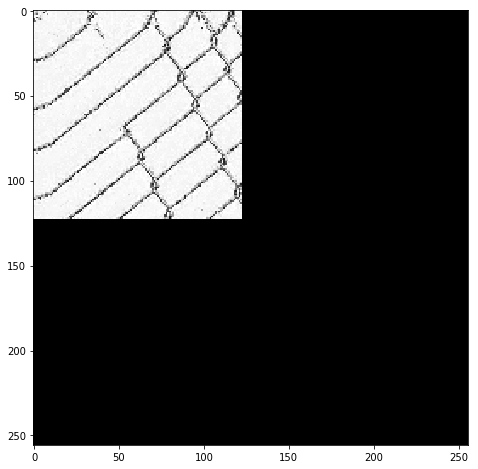

Iteration 123/256	Time: 565.466375113 seconds
Iteration 124/256	Time: 574.353486061 seconds
Iteration 125/256	Time: 583.570273161 seconds
Iteration 126/256	Time: 592.689916134 seconds
Iteration 127/256	Time: 601.877002001 seconds
Iteration 128/256	Time: 611.095306158 seconds
Iteration 129/256	Time: 620.342543125 seconds
Iteration 130/256	Time: 629.808714151 seconds
Iteration 131/256	Time: 639.318586111 seconds
Iteration 132/256	Time: 649.339607 seconds


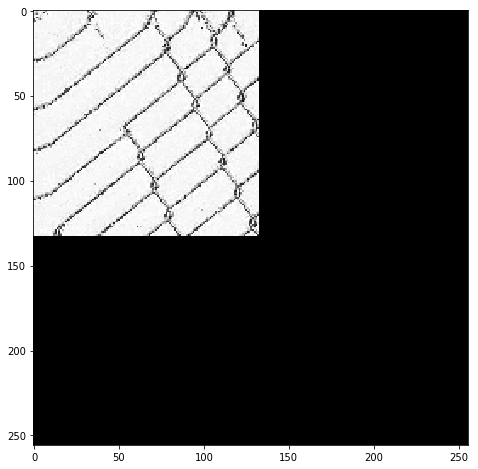

Iteration 133/256	Time: 659.480183125 seconds
Iteration 134/256	Time: 669.400017977 seconds
Iteration 135/256	Time: 679.438220024 seconds
Iteration 136/256	Time: 689.455480099 seconds
Iteration 137/256	Time: 699.472700119 seconds
Iteration 138/256	Time: 709.54541707 seconds
Iteration 139/256	Time: 719.77215004 seconds
Iteration 140/256	Time: 729.983744144 seconds
Iteration 141/256	Time: 740.428449154 seconds
Iteration 142/256	Time: 750.824179173 seconds


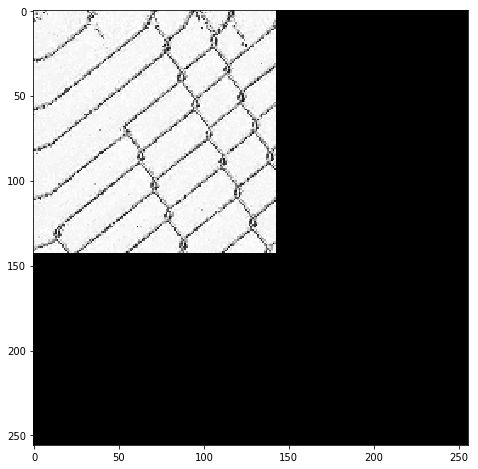

Iteration 143/256	Time: 761.473472118 seconds
Iteration 144/256	Time: 772.128934145 seconds
Iteration 145/256	Time: 782.747133017 seconds
Iteration 146/256	Time: 793.421643972 seconds
Iteration 147/256	Time: 804.251655102 seconds
Iteration 148/256	Time: 815.191583157 seconds
Iteration 149/256	Time: 826.238074064 seconds
Iteration 150/256	Time: 837.344997168 seconds
Iteration 151/256	Time: 848.76048708 seconds
Iteration 152/256	Time: 859.822235107 seconds


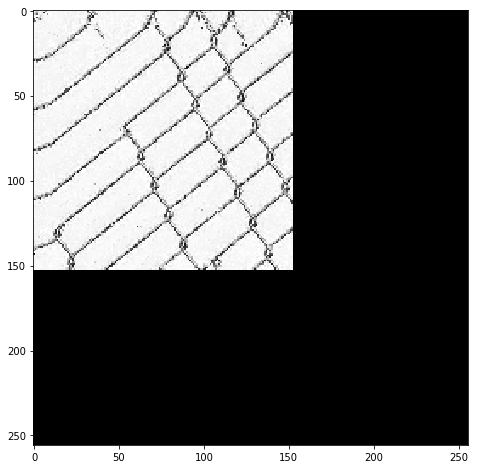

Iteration 153/256	Time: 871.284445047 seconds
Iteration 154/256	Time: 882.754683018 seconds
Iteration 155/256	Time: 894.06003499 seconds
Iteration 156/256	Time: 905.359642982 seconds
Iteration 157/256	Time: 916.708858013 seconds
Iteration 158/256	Time: 928.222695112 seconds
Iteration 159/256	Time: 939.741908073 seconds
Iteration 160/256	Time: 951.240143061 seconds
Iteration 161/256	Time: 962.786760092 seconds
Iteration 162/256	Time: 974.412058115 seconds


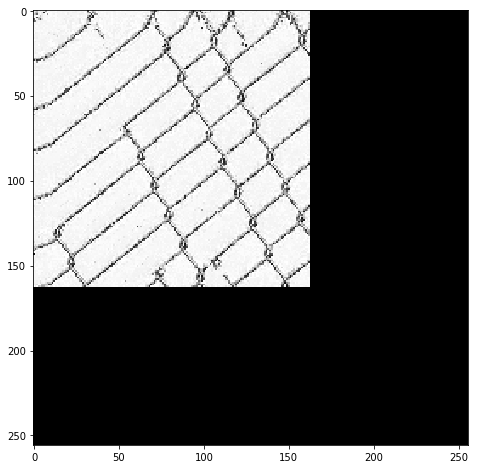

Iteration 163/256	Time: 986.281804085 seconds
Iteration 164/256	Time: 998.349427938 seconds
Iteration 165/256	Time: 1010.45936298 seconds
Iteration 166/256	Time: 1022.54235601 seconds
Iteration 167/256	Time: 1034.88392615 seconds
Iteration 168/256	Time: 1047.10644603 seconds
Iteration 169/256	Time: 1059.37176609 seconds
Iteration 170/256	Time: 1071.80904102 seconds
Iteration 171/256	Time: 1084.35699105 seconds
Iteration 172/256	Time: 1096.61424708 seconds


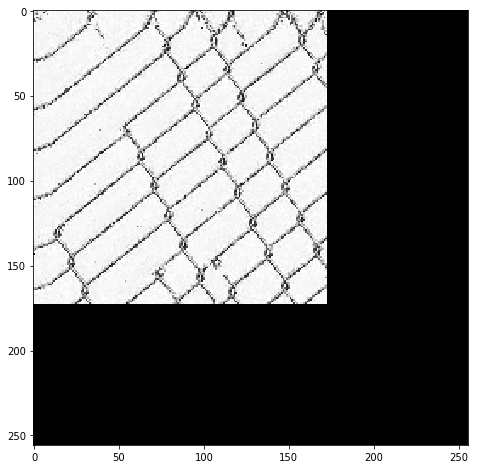

Iteration 173/256	Time: 1109.31501198 seconds
Iteration 174/256	Time: 1122.23110509 seconds
Iteration 175/256	Time: 1135.14223695 seconds
Iteration 176/256	Time: 1148.02424407 seconds
Iteration 177/256	Time: 1161.02155209 seconds
Iteration 178/256	Time: 1174.03702903 seconds
Iteration 179/256	Time: 1187.10503602 seconds
Iteration 180/256	Time: 1200.11919403 seconds
Iteration 181/256	Time: 1213.38478208 seconds
Iteration 182/256	Time: 1226.75804305 seconds


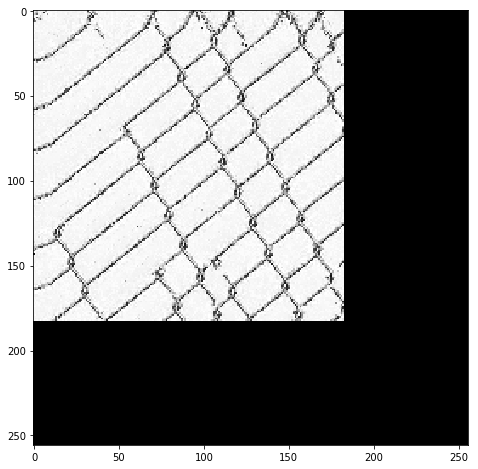

Iteration 183/256	Time: 1240.46407914 seconds
Iteration 184/256	Time: 1253.87347603 seconds
Iteration 185/256	Time: 1267.47034407 seconds
Iteration 186/256	Time: 1281.23183513 seconds
Iteration 187/256	Time: 1294.91094208 seconds
Iteration 188/256	Time: 1308.55571413 seconds
Iteration 189/256	Time: 1322.51435614 seconds
Iteration 190/256	Time: 1336.39890599 seconds
Iteration 191/256	Time: 1350.35441303 seconds
Iteration 192/256	Time: 1364.55818105 seconds


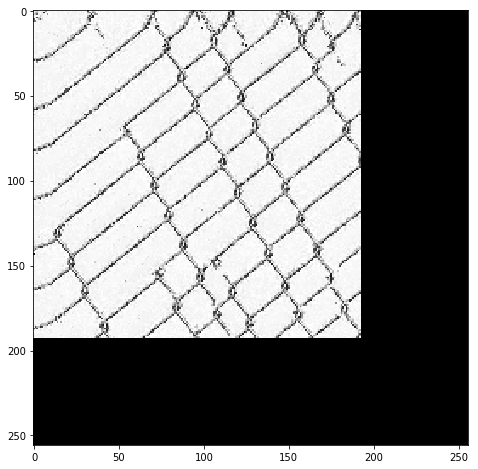

Iteration 193/256	Time: 1378.8505311 seconds
Iteration 194/256	Time: 1393.15347505 seconds
Iteration 195/256	Time: 1407.21513605 seconds
Iteration 196/256	Time: 1421.515939 seconds
Iteration 197/256	Time: 1436.02084994 seconds
Iteration 198/256	Time: 1450.56626415 seconds
Iteration 199/256	Time: 1465.13780499 seconds
Iteration 200/256	Time: 1480.20945311 seconds
Iteration 201/256	Time: 1495.46817207 seconds
Iteration 202/256	Time: 1510.41229296 seconds


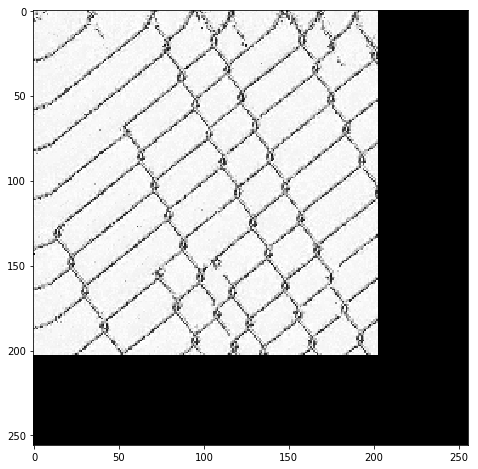

Iteration 203/256	Time: 1525.39898705 seconds
Iteration 204/256	Time: 1540.37134504 seconds
Iteration 205/256	Time: 1555.21023512 seconds
Iteration 206/256	Time: 1570.11836004 seconds
Iteration 207/256	Time: 1584.96863294 seconds
Iteration 208/256	Time: 1599.91484094 seconds
Iteration 209/256	Time: 1615.28316617 seconds
Iteration 210/256	Time: 1630.24718308 seconds
Iteration 211/256	Time: 1645.28672004 seconds
Iteration 212/256	Time: 1660.58192611 seconds


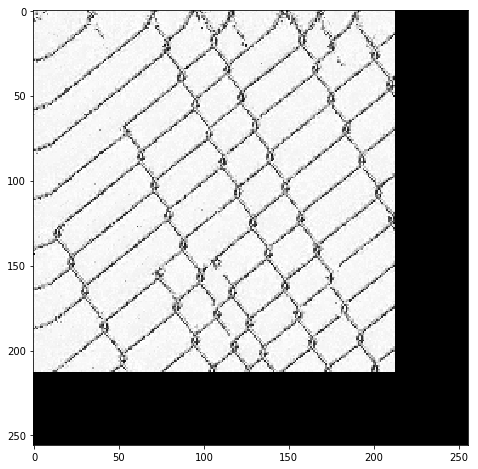

Iteration 213/256	Time: 1676.00292397 seconds
Iteration 214/256	Time: 1691.48973703 seconds
Iteration 215/256	Time: 1706.9591291 seconds
Iteration 216/256	Time: 1722.63321805 seconds
Iteration 217/256	Time: 1738.10964608 seconds
Iteration 218/256	Time: 1753.91830111 seconds
Iteration 219/256	Time: 1769.54135799 seconds
Iteration 220/256	Time: 1785.46651411 seconds
Iteration 221/256	Time: 1801.44813895 seconds
Iteration 222/256	Time: 1817.66943717 seconds


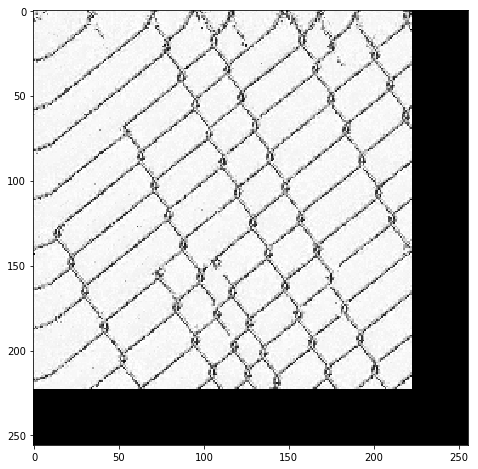

Iteration 223/256	Time: 1833.96833706 seconds
Iteration 224/256	Time: 1850.52761507 seconds
Iteration 225/256	Time: 1866.53645015 seconds
Iteration 226/256	Time: 1883.06388903 seconds
Iteration 227/256	Time: 1899.67281199 seconds
Iteration 228/256	Time: 1916.00962114 seconds
Iteration 229/256	Time: 1932.37550807 seconds
Iteration 230/256	Time: 1948.70370913 seconds
Iteration 231/256	Time: 1965.39840508 seconds
Iteration 232/256	Time: 1981.87719512 seconds


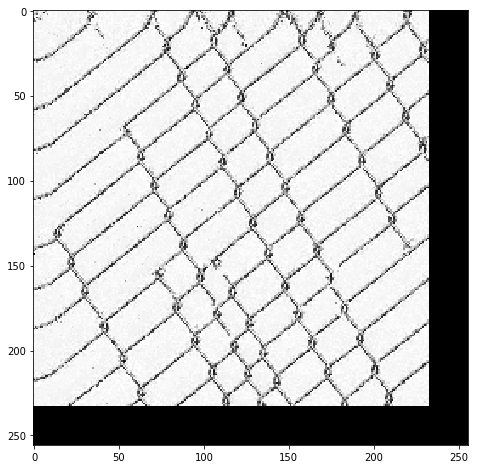

Iteration 233/256	Time: 1998.86823606 seconds
Iteration 234/256	Time: 2015.83400917 seconds
Iteration 235/256	Time: 2032.77458596 seconds
Iteration 236/256	Time: 2050.50691915 seconds
Iteration 237/256	Time: 2067.82251596 seconds
Iteration 238/256	Time: 2085.14943099 seconds
Iteration 239/256	Time: 2102.34416699 seconds
Iteration 240/256	Time: 2119.44154096 seconds
Iteration 241/256	Time: 2136.52379513 seconds
Iteration 242/256	Time: 2153.72952604 seconds


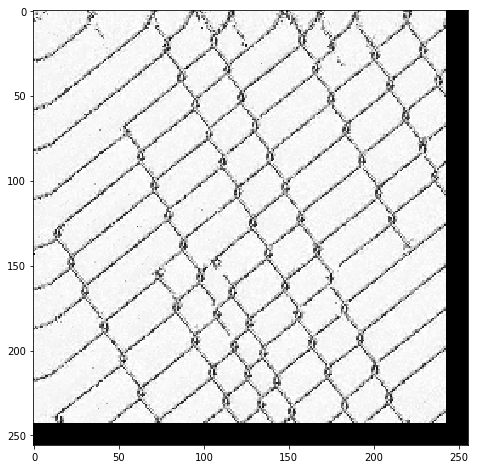

Iteration 243/256	Time: 2171.09604096 seconds
Iteration 244/256	Time: 2188.50328112 seconds
Iteration 245/256	Time: 2205.96324396 seconds
Iteration 246/256	Time: 2223.84812903 seconds
Iteration 247/256	Time: 2241.99744797 seconds
Iteration 248/256	Time: 2260.483531 seconds
Iteration 249/256	Time: 2279.02804399 seconds
Iteration 250/256	Time: 2298.90167117 seconds
Iteration 251/256	Time: 2319.14143014 seconds
Iteration 252/256	Time: 2339.23288202 seconds


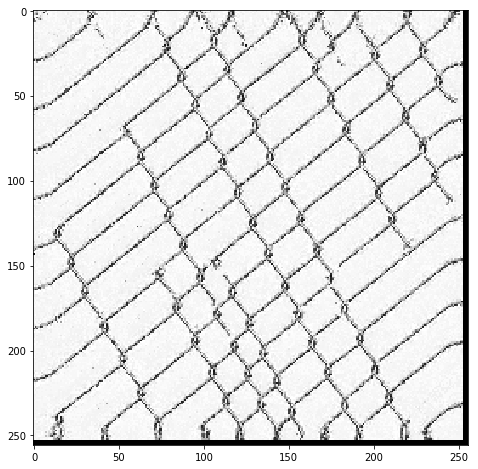

Iteration 253/256	Time: 2359.64002395 seconds
Iteration 254/256	Time: 2380.46608806 seconds
Iteration 255/256	Time: 2401.54026699 seconds
('Total Time: ', 2422.7306821346283, ' seconds')


In [31]:
texture_synthesize("fence.jpg", "out_fence.png", final_size_x=256, final_size_y=256, \
                   kernel_size=23,resize_factor=128)


Iteration 3/256	Time: 0.000845909118652 seconds
Iteration 4/256	Time: 0.107075929642 seconds
Iteration 5/256	Time: 0.198506832123 seconds
Iteration 6/256	Time: 0.307907819748 seconds
Iteration 7/256	Time: 0.425851821899 seconds
Iteration 8/256	Time: 0.549643993378 seconds
Iteration 9/256	Time: 0.676789999008 seconds
Iteration 10/256	Time: 0.794380903244 seconds
Iteration 11/256	Time: 0.896467924118 seconds
Iteration 12/256	Time: 1.00609993935 seconds


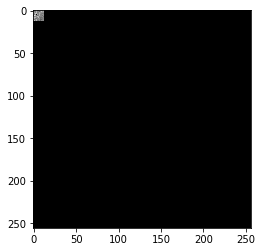

Iteration 13/256	Time: 1.28437399864 seconds
Iteration 14/256	Time: 1.45062088966 seconds
Iteration 15/256	Time: 1.6027598381 seconds
Iteration 16/256	Time: 1.77222490311 seconds
Iteration 17/256	Time: 1.94766497612 seconds
Iteration 18/256	Time: 2.11079192162 seconds
Iteration 19/256	Time: 2.2794380188 seconds
Iteration 20/256	Time: 2.45284080505 seconds
Iteration 21/256	Time: 2.63503479958 seconds
Iteration 22/256	Time: 2.82528281212 seconds


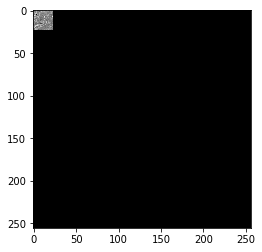

Iteration 23/256	Time: 3.26476788521 seconds
Iteration 24/256	Time: 3.4668648243 seconds
Iteration 25/256	Time: 3.64524078369 seconds
Iteration 26/256	Time: 3.85451984406 seconds
Iteration 27/256	Time: 4.06111598015 seconds
Iteration 28/256	Time: 4.25957679749 seconds
Iteration 29/256	Time: 4.46669483185 seconds
Iteration 30/256	Time: 4.67884993553 seconds
Iteration 31/256	Time: 4.91888284683 seconds
Iteration 32/256	Time: 5.15359401703 seconds


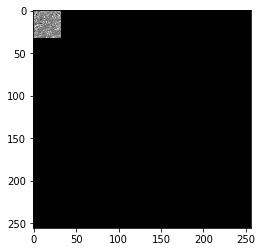

Iteration 33/256	Time: 5.49277281761 seconds
Iteration 34/256	Time: 5.73523497581 seconds
Iteration 35/256	Time: 5.97863292694 seconds
Iteration 36/256	Time: 6.27795886993 seconds
Iteration 37/256	Time: 6.56452798843 seconds
Iteration 38/256	Time: 6.84300279617 seconds
Iteration 39/256	Time: 7.13059091568 seconds
Iteration 40/256	Time: 7.4111289978 seconds
Iteration 41/256	Time: 7.71490097046 seconds
Iteration 42/256	Time: 8.02725791931 seconds


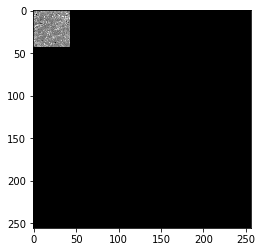

Iteration 43/256	Time: 8.44700980186 seconds
Iteration 44/256	Time: 8.77793598175 seconds
Iteration 45/256	Time: 9.08768582344 seconds
Iteration 46/256	Time: 9.38775086403 seconds
Iteration 47/256	Time: 9.7043697834 seconds
Iteration 48/256	Time: 10.013602972 seconds
Iteration 49/256	Time: 10.3319809437 seconds
Iteration 50/256	Time: 10.6865599155 seconds
Iteration 51/256	Time: 11.0374310017 seconds
Iteration 52/256	Time: 11.3960869312 seconds


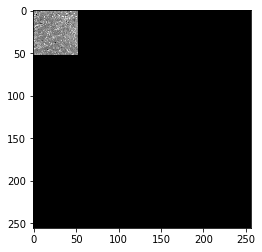

Iteration 53/256	Time: 11.8787448406 seconds
Iteration 54/256	Time: 12.2803778648 seconds
Iteration 55/256	Time: 12.6752898693 seconds
Iteration 56/256	Time: 13.075250864 seconds
Iteration 57/256	Time: 13.4764418602 seconds
Iteration 58/256	Time: 13.8557519913 seconds
Iteration 59/256	Time: 14.2290959358 seconds
Iteration 60/256	Time: 14.6153249741 seconds
Iteration 61/256	Time: 14.9870078564 seconds
Iteration 62/256	Time: 15.3746948242 seconds


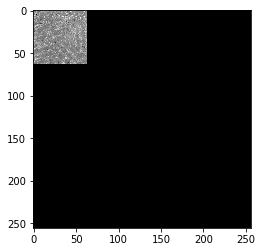

Iteration 63/256	Time: 15.8790998459 seconds
Iteration 64/256	Time: 16.3250339031 seconds
Iteration 65/256	Time: 16.7672569752 seconds
Iteration 66/256	Time: 17.2128529549 seconds
Iteration 67/256	Time: 17.6392838955 seconds
Iteration 68/256	Time: 18.0797348022 seconds
Iteration 69/256	Time: 18.5413589478 seconds
Iteration 70/256	Time: 19.0115909576 seconds
Iteration 71/256	Time: 19.4649658203 seconds
Iteration 72/256	Time: 19.9333338737 seconds


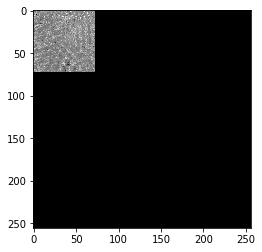

Iteration 73/256	Time: 20.4927349091 seconds
Iteration 74/256	Time: 21.0539269447 seconds
Iteration 75/256	Time: 21.5310227871 seconds
Iteration 76/256	Time: 22.0559358597 seconds
Iteration 77/256	Time: 22.5863978863 seconds
Iteration 78/256	Time: 23.1524238586 seconds
Iteration 79/256	Time: 23.6847689152 seconds
Iteration 80/256	Time: 24.2012279034 seconds
Iteration 81/256	Time: 24.7250277996 seconds
Iteration 82/256	Time: 25.2338058949 seconds


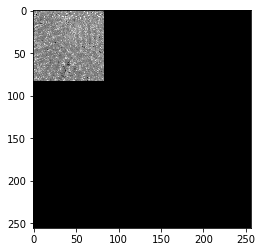

Iteration 83/256	Time: 26.0165808201 seconds
Iteration 84/256	Time: 26.840638876 seconds
Iteration 85/256	Time: 27.5147879124 seconds
Iteration 86/256	Time: 28.1221399307 seconds
Iteration 87/256	Time: 28.7347989082 seconds
Iteration 88/256	Time: 29.3962209225 seconds
Iteration 89/256	Time: 30.0436689854 seconds
Iteration 90/256	Time: 30.7955927849 seconds
Iteration 91/256	Time: 31.5259208679 seconds
Iteration 92/256	Time: 32.2078700066 seconds


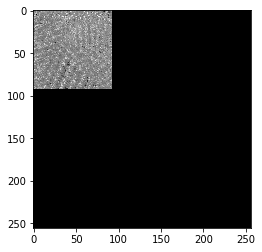

Iteration 93/256	Time: 32.9834029675 seconds
Iteration 94/256	Time: 33.6878728867 seconds
Iteration 95/256	Time: 34.3600130081 seconds
Iteration 96/256	Time: 35.0608329773 seconds
Iteration 97/256	Time: 35.8274087906 seconds
Iteration 98/256	Time: 36.5597259998 seconds
Iteration 99/256	Time: 37.7292869091 seconds
Iteration 100/256	Time: 38.6772480011 seconds
Iteration 101/256	Time: 39.4305298328 seconds
Iteration 102/256	Time: 40.2338910103 seconds


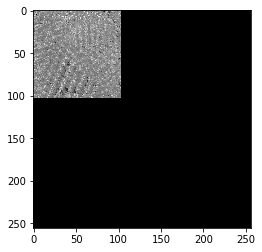

Iteration 103/256	Time: 41.1987118721 seconds
Iteration 104/256	Time: 41.9977998734 seconds
Iteration 105/256	Time: 43.1268529892 seconds
Iteration 106/256	Time: 43.8382048607 seconds
Iteration 107/256	Time: 44.5336308479 seconds
Iteration 108/256	Time: 45.2170598507 seconds
Iteration 109/256	Time: 46.1481328011 seconds
Iteration 110/256	Time: 46.9943168163 seconds
Iteration 111/256	Time: 47.786703825 seconds
Iteration 112/256	Time: 48.6429948807 seconds


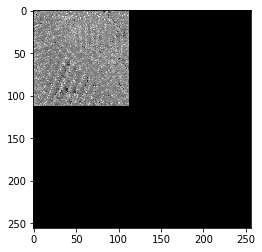

Iteration 113/256	Time: 49.6932969093 seconds
Iteration 114/256	Time: 50.7588379383 seconds
Iteration 115/256	Time: 51.6125729084 seconds
Iteration 116/256	Time: 52.4069678783 seconds
Iteration 117/256	Time: 53.2467329502 seconds
Iteration 118/256	Time: 54.1974098682 seconds
Iteration 119/256	Time: 55.0471539497 seconds
Iteration 120/256	Time: 55.8352608681 seconds
Iteration 121/256	Time: 56.6178359985 seconds
Iteration 122/256	Time: 57.3779389858 seconds


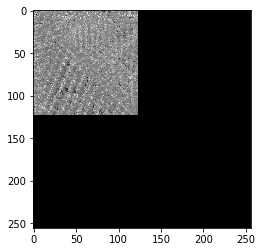

Iteration 123/256	Time: 58.2606959343 seconds
Iteration 124/256	Time: 59.1357939243 seconds
Iteration 125/256	Time: 59.9545238018 seconds
Iteration 126/256	Time: 60.7548239231 seconds
Iteration 127/256	Time: 61.5717549324 seconds
Iteration 128/256	Time: 62.3296658993 seconds
Iteration 129/256	Time: 63.1216218472 seconds
Iteration 130/256	Time: 63.9751119614 seconds
Iteration 131/256	Time: 64.8876378536 seconds
Iteration 132/256	Time: 65.7631599903 seconds


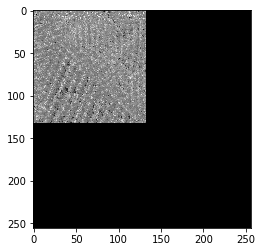

Iteration 133/256	Time: 66.6902208328 seconds
Iteration 134/256	Time: 67.5110859871 seconds
Iteration 135/256	Time: 68.3017249107 seconds
Iteration 136/256	Time: 69.2587859631 seconds
Iteration 137/256	Time: 70.1580629349 seconds
Iteration 138/256	Time: 71.0787308216 seconds
Iteration 139/256	Time: 71.8836967945 seconds
Iteration 140/256	Time: 72.7021329403 seconds
Iteration 141/256	Time: 73.5915617943 seconds
Iteration 142/256	Time: 74.5278179646 seconds


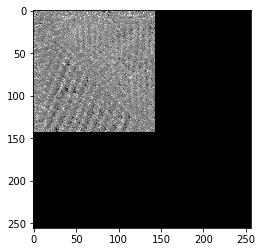

Iteration 143/256	Time: 75.5555520058 seconds
Iteration 144/256	Time: 76.4049608707 seconds
Iteration 145/256	Time: 77.2291059494 seconds
Iteration 146/256	Time: 78.1241219044 seconds
Iteration 147/256	Time: 79.1397099495 seconds
Iteration 148/256	Time: 80.0970768929 seconds
Iteration 149/256	Time: 81.0328929424 seconds
Iteration 150/256	Time: 81.9499838352 seconds
Iteration 151/256	Time: 82.8574919701 seconds
Iteration 152/256	Time: 83.8257079124 seconds


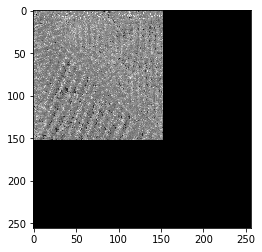

Iteration 153/256	Time: 84.8717999458 seconds
Iteration 154/256	Time: 85.8379650116 seconds
Iteration 155/256	Time: 86.7812759876 seconds
Iteration 156/256	Time: 87.7452099323 seconds
Iteration 157/256	Time: 88.8196909428 seconds
Iteration 158/256	Time: 89.853402853 seconds
Iteration 159/256	Time: 90.8330338001 seconds
Iteration 160/256	Time: 91.7875809669 seconds
Iteration 161/256	Time: 92.842592001 seconds
Iteration 162/256	Time: 93.9599249363 seconds


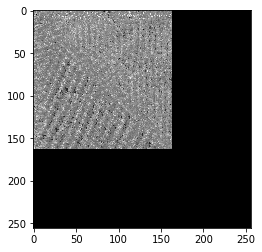

Iteration 163/256	Time: 95.224257946 seconds
Iteration 164/256	Time: 96.4603838921 seconds
Iteration 165/256	Time: 97.4872128963 seconds
Iteration 166/256	Time: 98.5906839371 seconds
Iteration 167/256	Time: 99.6485908031 seconds
Iteration 168/256	Time: 100.624198914 seconds
Iteration 169/256	Time: 101.611922979 seconds
Iteration 170/256	Time: 102.729317904 seconds
Iteration 171/256	Time: 103.831877947 seconds
Iteration 172/256	Time: 104.933877945 seconds


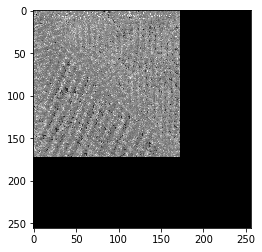

Iteration 173/256	Time: 106.082932949 seconds
Iteration 174/256	Time: 107.548835993 seconds
Iteration 175/256	Time: 108.88775897 seconds
Iteration 176/256	Time: 109.992082834 seconds
Iteration 177/256	Time: 111.0363729 seconds
Iteration 178/256	Time: 112.201225996 seconds
Iteration 179/256	Time: 113.455190897 seconds
Iteration 180/256	Time: 114.565152884 seconds
Iteration 181/256	Time: 115.672924995 seconds
Iteration 182/256	Time: 116.843953848 seconds


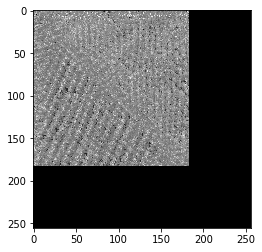

Iteration 183/256	Time: 118.151427984 seconds
Iteration 184/256	Time: 119.387322903 seconds
Iteration 185/256	Time: 120.487376928 seconds
Iteration 186/256	Time: 121.681732893 seconds
Iteration 187/256	Time: 122.921428919 seconds
Iteration 188/256	Time: 124.112294912 seconds
Iteration 189/256	Time: 125.236585855 seconds
Iteration 190/256	Time: 126.497677803 seconds
Iteration 191/256	Time: 127.82921195 seconds
Iteration 192/256	Time: 129.034292936 seconds


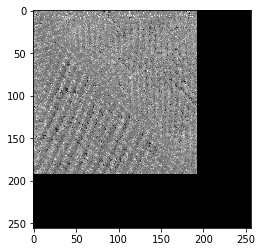

Iteration 193/256	Time: 130.317820787 seconds
Iteration 194/256	Time: 131.669691801 seconds
Iteration 195/256	Time: 132.875433922 seconds
Iteration 196/256	Time: 134.068267822 seconds
Iteration 197/256	Time: 135.291419983 seconds
Iteration 198/256	Time: 136.662636995 seconds
Iteration 199/256	Time: 137.932806015 seconds
Iteration 200/256	Time: 139.121514797 seconds
Iteration 201/256	Time: 140.364820004 seconds
Iteration 202/256	Time: 141.740324974 seconds


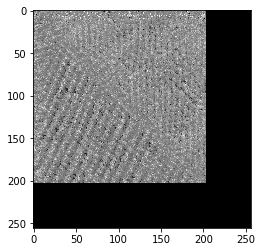

Iteration 203/256	Time: 143.159226894 seconds
Iteration 204/256	Time: 144.351191998 seconds
Iteration 205/256	Time: 145.609507799 seconds
Iteration 206/256	Time: 146.90090394 seconds
Iteration 207/256	Time: 148.14615202 seconds
Iteration 208/256	Time: 149.319001913 seconds
Iteration 209/256	Time: 150.6916399 seconds
Iteration 210/256	Time: 152.076008797 seconds
Iteration 211/256	Time: 153.311805964 seconds
Iteration 212/256	Time: 154.52845192 seconds


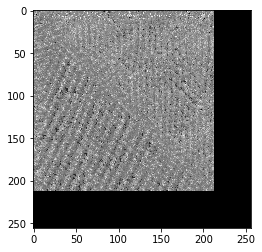

Iteration 213/256	Time: 156.012158871 seconds
Iteration 214/256	Time: 157.328851938 seconds
Iteration 215/256	Time: 158.569002867 seconds
Iteration 216/256	Time: 159.87702179 seconds
Iteration 217/256	Time: 161.228240967 seconds
Iteration 218/256	Time: 162.548470974 seconds
Iteration 219/256	Time: 163.810523987 seconds
Iteration 220/256	Time: 165.199508905 seconds
Iteration 221/256	Time: 166.57079792 seconds
Iteration 222/256	Time: 167.878050804 seconds


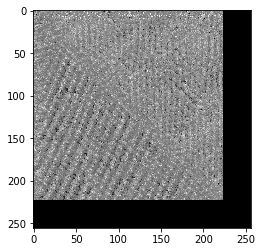

Iteration 223/256	Time: 169.460434914 seconds
Iteration 224/256	Time: 171.138418913 seconds
Iteration 225/256	Time: 172.472653866 seconds
Iteration 226/256	Time: 173.785906792 seconds
Iteration 227/256	Time: 175.342132807 seconds
Iteration 228/256	Time: 176.737782001 seconds
Iteration 229/256	Time: 178.044215918 seconds
Iteration 230/256	Time: 179.494241953 seconds
Iteration 231/256	Time: 180.895195961 seconds
Iteration 232/256	Time: 182.234336853 seconds


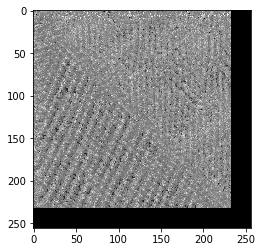

Iteration 233/256	Time: 183.829011917 seconds
Iteration 234/256	Time: 185.417114973 seconds
Iteration 235/256	Time: 186.823723793 seconds
Iteration 236/256	Time: 188.236188889 seconds
Iteration 237/256	Time: 189.791388988 seconds
Iteration 238/256	Time: 191.233092785 seconds
Iteration 239/256	Time: 192.605805874 seconds
Iteration 240/256	Time: 194.127213001 seconds
Iteration 241/256	Time: 195.554757833 seconds
Iteration 242/256	Time: 196.930433989 seconds


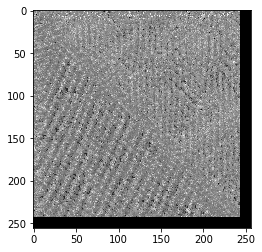

Iteration 243/256	Time: 198.72428298 seconds
Iteration 244/256	Time: 200.415810823 seconds
Iteration 245/256	Time: 201.817286968 seconds
Iteration 246/256	Time: 203.367891788 seconds
Iteration 247/256	Time: 204.957028866 seconds
Iteration 248/256	Time: 206.56385088 seconds
Iteration 249/256	Time: 208.321056843 seconds
Iteration 250/256	Time: 210.314359903 seconds
Iteration 251/256	Time: 212.289013863 seconds
Iteration 252/256	Time: 214.5652349 seconds


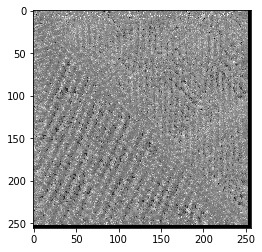

Iteration 253/256	Time: 216.889954805 seconds
Iteration 254/256	Time: 219.490732908 seconds
Iteration 255/256	Time: 222.021082878 seconds
('Total Time: ', 224.84478783607483, ' seconds')


In [7]:
texture_synthesize("jelly_beans.png", "out_jelly.png", final_size_x=256, final_size_y=256,\
                   kernel_size=21, resize_factor=64)

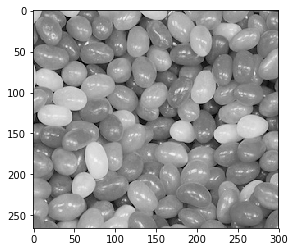

In [8]:
im = Image.open('./jelly_beans.png').convert("L")
plt.imshow(im)
plt.show()

Iteration 3/256	Time: 0.000335931777954 seconds
Iteration 4/256	Time: 0.107882976532 seconds
Iteration 5/256	Time: 0.204439878464 seconds
Iteration 6/256	Time: 0.311780929565 seconds
Iteration 7/256	Time: 0.429521083832 seconds
Iteration 8/256	Time: 0.551815032959 seconds
Iteration 9/256	Time: 0.676284074783 seconds
Iteration 10/256	Time: 0.789628982544 seconds
Iteration 11/256	Time: 0.891273975372 seconds
Iteration 12/256	Time: 0.999857902527 seconds


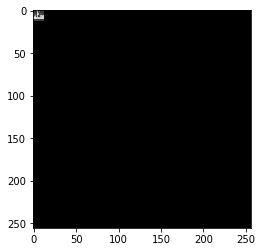

Iteration 13/256	Time: 1.20056796074 seconds
Iteration 14/256	Time: 1.32441091537 seconds
Iteration 15/256	Time: 1.44726705551 seconds
Iteration 16/256	Time: 1.57507991791 seconds
Iteration 17/256	Time: 1.70980191231 seconds
Iteration 18/256	Time: 1.85292100906 seconds
Iteration 19/256	Time: 2.00913691521 seconds
Iteration 20/256	Time: 2.19313597679 seconds
Iteration 21/256	Time: 2.37611889839 seconds
Iteration 22/256	Time: 2.56089997292 seconds


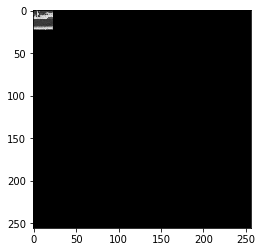

Iteration 23/256	Time: 2.90055203438 seconds
Iteration 24/256	Time: 3.12633705139 seconds
Iteration 25/256	Time: 3.43590402603 seconds
Iteration 26/256	Time: 3.72781801224 seconds
Iteration 27/256	Time: 4.0009970665 seconds
Iteration 28/256	Time: 4.26195693016 seconds
Iteration 29/256	Time: 4.52117991447 seconds
Iteration 30/256	Time: 4.79466986656 seconds
Iteration 31/256	Time: 5.07176303864 seconds
Iteration 32/256	Time: 5.34526085854 seconds


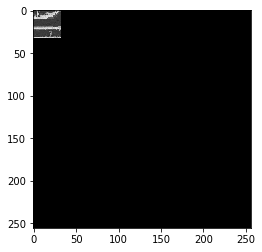

Iteration 33/256	Time: 5.71310186386 seconds
Iteration 34/256	Time: 6.00880002975 seconds
Iteration 35/256	Time: 6.31441402435 seconds
Iteration 36/256	Time: 6.61138796806 seconds
Iteration 37/256	Time: 6.93184304237 seconds
Iteration 38/256	Time: 7.31089496613 seconds
Iteration 39/256	Time: 7.68964385986 seconds
Iteration 40/256	Time: 8.049669981 seconds
Iteration 41/256	Time: 8.39973807335 seconds
Iteration 42/256	Time: 8.75464701653 seconds


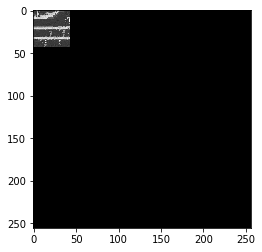

Iteration 43/256	Time: 9.20530891418 seconds
Iteration 44/256	Time: 9.55917906761 seconds
Iteration 45/256	Time: 9.88109898567 seconds
Iteration 46/256	Time: 10.2213740349 seconds
Iteration 47/256	Time: 10.5663468838 seconds
Iteration 48/256	Time: 10.9130148888 seconds
Iteration 49/256	Time: 11.2976160049 seconds
Iteration 50/256	Time: 11.698996067 seconds
Iteration 51/256	Time: 12.1141550541 seconds
Iteration 52/256	Time: 12.4859929085 seconds


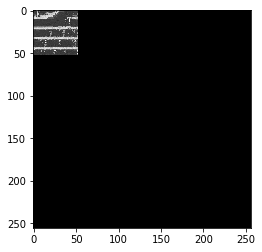

Iteration 53/256	Time: 12.9561989307 seconds
Iteration 54/256	Time: 13.3717808723 seconds
Iteration 55/256	Time: 13.7933039665 seconds
Iteration 56/256	Time: 14.2164530754 seconds
Iteration 57/256	Time: 14.6378769875 seconds
Iteration 58/256	Time: 15.0766410828 seconds
Iteration 59/256	Time: 15.5358538628 seconds
Iteration 60/256	Time: 15.9888269901 seconds
Iteration 61/256	Time: 16.4451460838 seconds
Iteration 62/256	Time: 16.9751770496 seconds


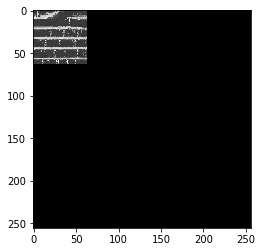

Iteration 63/256	Time: 17.6235859394 seconds
Iteration 64/256	Time: 18.1388170719 seconds
Iteration 65/256	Time: 18.6674170494 seconds
Iteration 66/256	Time: 19.1722099781 seconds
Iteration 67/256	Time: 19.6689958572 seconds
Iteration 68/256	Time: 20.1686959267 seconds
Iteration 69/256	Time: 20.699395895 seconds
Iteration 70/256	Time: 21.2534608841 seconds
Iteration 71/256	Time: 21.9089770317 seconds
Iteration 72/256	Time: 22.5018160343 seconds


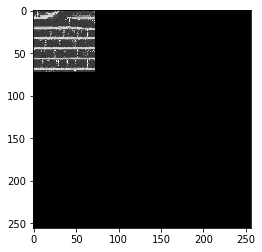

Iteration 73/256	Time: 23.1859989166 seconds
Iteration 74/256	Time: 23.7672970295 seconds
Iteration 75/256	Time: 24.3096549511 seconds
Iteration 76/256	Time: 24.8368868828 seconds
Iteration 77/256	Time: 25.4345378876 seconds
Iteration 78/256	Time: 26.0274679661 seconds
Iteration 79/256	Time: 26.6845550537 seconds
Iteration 80/256	Time: 27.3801679611 seconds
Iteration 81/256	Time: 28.0097498894 seconds
Iteration 82/256	Time: 28.6383910179 seconds


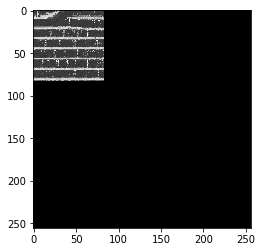

Iteration 83/256	Time: 29.3117380142 seconds
Iteration 84/256	Time: 29.9189550877 seconds
Iteration 85/256	Time: 30.5598390102 seconds
Iteration 86/256	Time: 31.2906739712 seconds
Iteration 87/256	Time: 32.033823967 seconds
Iteration 88/256	Time: 32.6963670254 seconds
Iteration 89/256	Time: 33.3939900398 seconds
Iteration 90/256	Time: 34.0316798687 seconds
Iteration 91/256	Time: 34.7210600376 seconds
Iteration 92/256	Time: 35.4108800888 seconds


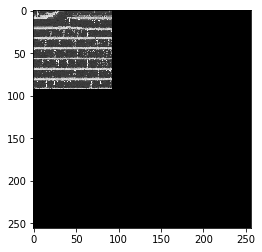

Iteration 93/256	Time: 36.2601890564 seconds
Iteration 94/256	Time: 36.9569559097 seconds
Iteration 95/256	Time: 37.646312952 seconds
Iteration 96/256	Time: 38.385627985 seconds
Iteration 97/256	Time: 39.1018710136 seconds
Iteration 98/256	Time: 39.8574459553 seconds
Iteration 99/256	Time: 40.6166138649 seconds
Iteration 100/256	Time: 41.4975969791 seconds
Iteration 101/256	Time: 42.3093569279 seconds
Iteration 102/256	Time: 43.0426619053 seconds


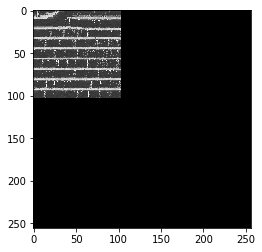

Iteration 103/256	Time: 43.85510993 seconds
Iteration 104/256	Time: 44.6283280849 seconds
Iteration 105/256	Time: 45.433907032 seconds
Iteration 106/256	Time: 46.3299250603 seconds
Iteration 107/256	Time: 47.133961916 seconds
Iteration 108/256	Time: 47.9050838947 seconds
Iteration 109/256	Time: 48.6756980419 seconds
Iteration 110/256	Time: 49.4369828701 seconds
Iteration 111/256	Time: 50.2809529305 seconds
Iteration 112/256	Time: 51.181276083 seconds


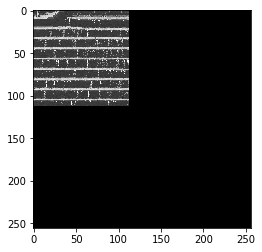

Iteration 113/256	Time: 52.1859650612 seconds
Iteration 114/256	Time: 53.037129879 seconds
Iteration 115/256	Time: 53.8578240871 seconds
Iteration 116/256	Time: 54.8496499062 seconds
Iteration 117/256	Time: 55.6438949108 seconds
Iteration 118/256	Time: 56.3880169392 seconds
Iteration 119/256	Time: 57.0953328609 seconds
Iteration 120/256	Time: 57.8236589432 seconds
Iteration 121/256	Time: 58.5410120487 seconds
Iteration 122/256	Time: 59.2489390373 seconds


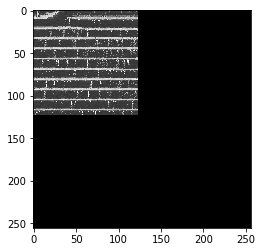

Iteration 123/256	Time: 60.1893930435 seconds
Iteration 124/256	Time: 60.9589688778 seconds
Iteration 125/256	Time: 61.7311069965 seconds
Iteration 126/256	Time: 62.5047860146 seconds
Iteration 127/256	Time: 63.2396409512 seconds
Iteration 128/256	Time: 63.9934248924 seconds
Iteration 129/256	Time: 64.833605051 seconds
Iteration 130/256	Time: 65.7756109238 seconds
Iteration 131/256	Time: 66.6262578964 seconds
Iteration 132/256	Time: 67.4433460236 seconds


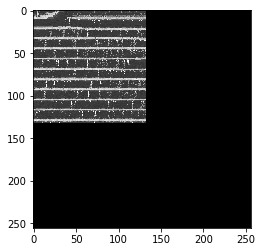

Iteration 133/256	Time: 68.3880670071 seconds
Iteration 134/256	Time: 69.5380220413 seconds
Iteration 135/256	Time: 70.4065818787 seconds
Iteration 136/256	Time: 71.2045240402 seconds
Iteration 137/256	Time: 72.0431520939 seconds
Iteration 138/256	Time: 73.0780038834 seconds
Iteration 139/256	Time: 74.3476500511 seconds
Iteration 140/256	Time: 75.2048590183 seconds
Iteration 141/256	Time: 76.0599389076 seconds
Iteration 142/256	Time: 76.9161119461 seconds


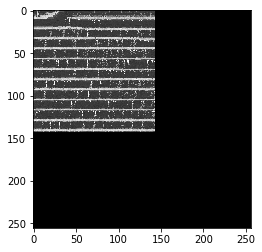

Iteration 143/256	Time: 77.8694119453 seconds
Iteration 144/256	Time: 78.7486290932 seconds
Iteration 145/256	Time: 79.7710309029 seconds
Iteration 146/256	Time: 80.7038328648 seconds
Iteration 147/256	Time: 81.6094958782 seconds
Iteration 148/256	Time: 82.4851109982 seconds
Iteration 149/256	Time: 83.3286969662 seconds
Iteration 150/256	Time: 84.2804040909 seconds
Iteration 151/256	Time: 85.2169349194 seconds
Iteration 152/256	Time: 86.1723890305 seconds


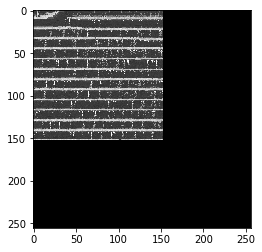

Iteration 153/256	Time: 87.1505260468 seconds
Iteration 154/256	Time: 88.1193468571 seconds
Iteration 155/256	Time: 89.1322829723 seconds
Iteration 156/256	Time: 90.1497159004 seconds
Iteration 157/256	Time: 91.1546430588 seconds
Iteration 158/256	Time: 92.0977060795 seconds
Iteration 159/256	Time: 93.0387680531 seconds
Iteration 160/256	Time: 94.0822899342 seconds
Iteration 161/256	Time: 95.0693740845 seconds
Iteration 162/256	Time: 96.0991029739 seconds


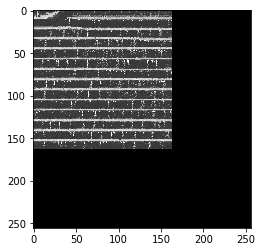

Iteration 163/256	Time: 97.1652779579 seconds
Iteration 164/256	Time: 98.2477359772 seconds
Iteration 165/256	Time: 99.3854570389 seconds
Iteration 166/256	Time: 100.53252697 seconds
Iteration 167/256	Time: 101.518723011 seconds
Iteration 168/256	Time: 102.503160954 seconds
Iteration 169/256	Time: 103.642239094 seconds
Iteration 170/256	Time: 104.763297081 seconds
Iteration 171/256	Time: 105.825955868 seconds
Iteration 172/256	Time: 106.845453024 seconds


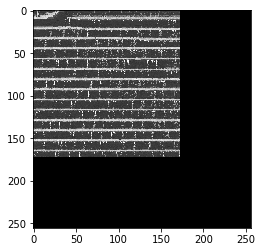

Iteration 173/256	Time: 108.005487919 seconds
Iteration 174/256	Time: 109.187479973 seconds
Iteration 175/256	Time: 110.351655006 seconds
Iteration 176/256	Time: 111.379626036 seconds
Iteration 177/256	Time: 112.39281702 seconds
Iteration 178/256	Time: 113.579868078 seconds
Iteration 179/256	Time: 114.714443922 seconds
Iteration 180/256	Time: 115.860497952 seconds
Iteration 181/256	Time: 117.02572298 seconds
Iteration 182/256	Time: 118.251847982 seconds


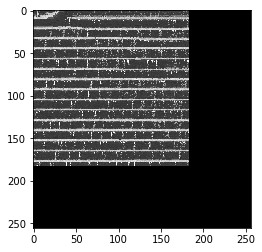

Iteration 183/256	Time: 119.445375919 seconds
Iteration 184/256	Time: 120.61324501 seconds
Iteration 185/256	Time: 121.685571909 seconds
Iteration 186/256	Time: 122.798245907 seconds
Iteration 187/256	Time: 123.946162939 seconds
Iteration 188/256	Time: 125.073237896 seconds
Iteration 189/256	Time: 126.190120935 seconds
Iteration 190/256	Time: 127.308350086 seconds
Iteration 191/256	Time: 128.485039949 seconds
Iteration 192/256	Time: 129.696331978 seconds


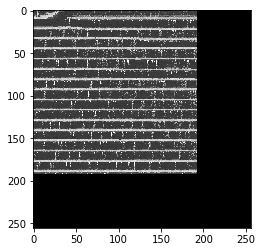

Iteration 193/256	Time: 130.944753885 seconds
Iteration 194/256	Time: 132.128171921 seconds
Iteration 195/256	Time: 133.367616892 seconds
Iteration 196/256	Time: 134.62093997 seconds
Iteration 197/256	Time: 135.730324984 seconds
Iteration 198/256	Time: 136.951113939 seconds
Iteration 199/256	Time: 138.235938072 seconds
Iteration 200/256	Time: 139.437335968 seconds
Iteration 201/256	Time: 140.581165075 seconds
Iteration 202/256	Time: 141.824800014 seconds


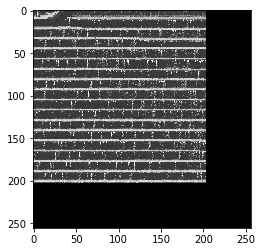

Iteration 203/256	Time: 143.212787867 seconds
Iteration 204/256	Time: 144.484436035 seconds
Iteration 205/256	Time: 145.669162989 seconds
Iteration 206/256	Time: 146.988903999 seconds
Iteration 207/256	Time: 148.360743999 seconds
Iteration 208/256	Time: 149.644270897 seconds
Iteration 209/256	Time: 150.840143919 seconds
Iteration 210/256	Time: 152.249520063 seconds
Iteration 211/256	Time: 153.566011906 seconds
Iteration 212/256	Time: 154.827226877 seconds


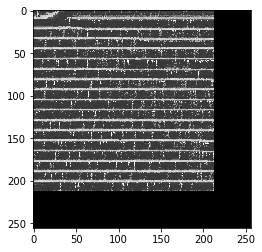

Iteration 213/256	Time: 156.23564887 seconds
Iteration 214/256	Time: 157.562361956 seconds
Iteration 215/256	Time: 158.860168934 seconds
Iteration 216/256	Time: 160.115421057 seconds
Iteration 217/256	Time: 161.482707024 seconds
Iteration 218/256	Time: 162.847773075 seconds
Iteration 219/256	Time: 164.10841608 seconds
Iteration 220/256	Time: 165.356602907 seconds
Iteration 221/256	Time: 166.732146978 seconds
Iteration 222/256	Time: 168.052013874 seconds


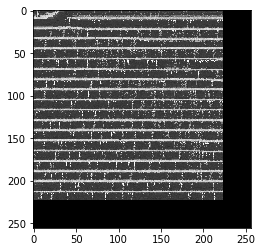

Iteration 223/256	Time: 169.458613873 seconds
Iteration 224/256	Time: 170.916692019 seconds
Iteration 225/256	Time: 172.280745983 seconds
Iteration 226/256	Time: 173.878298998 seconds
Iteration 227/256	Time: 175.243560076 seconds
Iteration 228/256	Time: 176.764322996 seconds
Iteration 229/256	Time: 178.144556046 seconds
Iteration 230/256	Time: 179.856647015 seconds
Iteration 231/256	Time: 181.469407082 seconds
Iteration 232/256	Time: 182.911361933 seconds


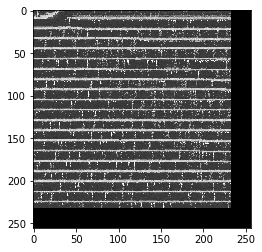

Iteration 233/256	Time: 184.376530886 seconds
Iteration 234/256	Time: 185.847578049 seconds
Iteration 235/256	Time: 187.274637938 seconds
Iteration 236/256	Time: 188.64083004 seconds
Iteration 237/256	Time: 189.998019934 seconds
Iteration 238/256	Time: 191.478138924 seconds
Iteration 239/256	Time: 192.843479872 seconds
Iteration 240/256	Time: 194.284800053 seconds
Iteration 241/256	Time: 195.656113863 seconds
Iteration 242/256	Time: 197.067656994 seconds


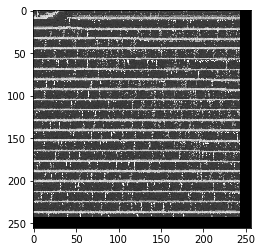

Iteration 243/256	Time: 198.695313931 seconds
Iteration 244/256	Time: 200.39169693 seconds
Iteration 245/256	Time: 201.883908033 seconds
Iteration 246/256	Time: 203.364989042 seconds
Iteration 247/256	Time: 205.08169508 seconds
Iteration 248/256	Time: 206.77097702 seconds
Iteration 249/256	Time: 208.65503788 seconds
Iteration 250/256	Time: 210.660703897 seconds
Iteration 251/256	Time: 212.576663971 seconds
Iteration 252/256	Time: 214.852621078 seconds


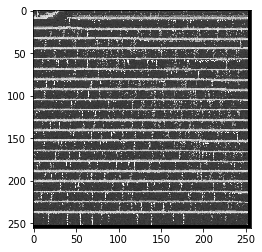

Iteration 253/256	Time: 217.182604074 seconds
Iteration 254/256	Time: 219.642827034 seconds
Iteration 255/256	Time: 222.014359951 seconds
('Total Time: ', 224.85655188560486, ' seconds')


In [10]:
texture_synthesize("bricks.png", "out_bricks.png", final_size_x=256, final_size_y=256,\
                   kernel_size=21, resize_factor=64)

Iteration 3/256	Time: 0.000399112701416 seconds
Iteration 4/256	Time: 0.376340150833 seconds
Iteration 5/256	Time: 0.855249166489 seconds
Iteration 6/256	Time: 1.40837812424 seconds
Iteration 7/256	Time: 2.03516316414 seconds
Iteration 8/256	Time: 2.80029916763 seconds
Iteration 9/256	Time: 3.65307402611 seconds
Iteration 10/256	Time: 4.56789016724 seconds
Iteration 11/256	Time: 5.57537913322 seconds
Iteration 12/256	Time: 6.6118850708 seconds


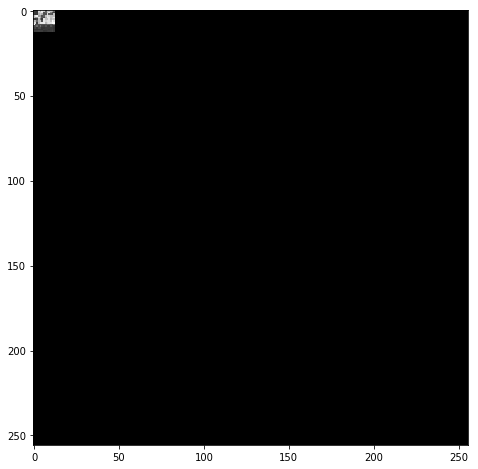

Iteration 13/256	Time: 7.90445208549 seconds
Iteration 14/256	Time: 9.22652101517 seconds
Iteration 15/256	Time: 10.5997049809 seconds
Iteration 16/256	Time: 12.0898880959 seconds
Iteration 17/256	Time: 13.6572270393 seconds
Iteration 18/256	Time: 15.2266960144 seconds
Iteration 19/256	Time: 16.8662621975 seconds
Iteration 20/256	Time: 18.631537199 seconds
Iteration 21/256	Time: 20.5089931488 seconds
Iteration 22/256	Time: 22.4248321056 seconds


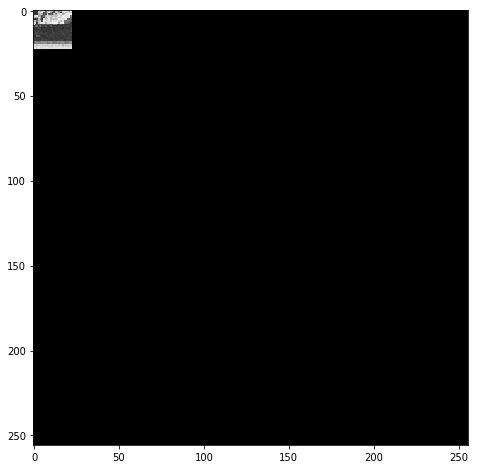

Iteration 23/256	Time: 24.5807640553 seconds
Iteration 24/256	Time: 26.7323901653 seconds
Iteration 25/256	Time: 28.9526200294 seconds
Iteration 26/256	Time: 31.2779932022 seconds
Iteration 27/256	Time: 33.6498610973 seconds
Iteration 28/256	Time: 36.0833551884 seconds
Iteration 29/256	Time: 38.6172142029 seconds
Iteration 30/256	Time: 41.2903339863 seconds
Iteration 31/256	Time: 44.0030829906 seconds
Iteration 32/256	Time: 46.7980501652 seconds


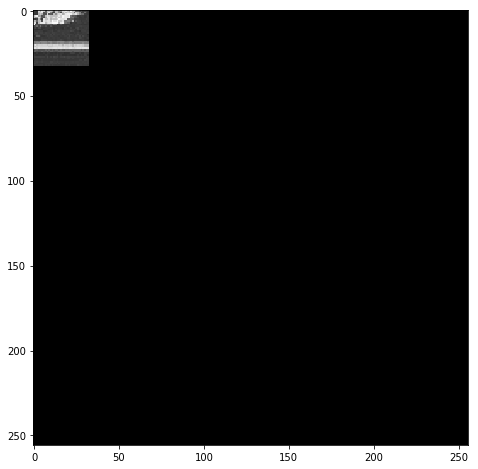

Iteration 33/256	Time: 49.7824821472 seconds
Iteration 34/256	Time: 52.8872861862 seconds
Iteration 35/256	Time: 55.9817080498 seconds
Iteration 36/256	Time: 59.1814920902 seconds
Iteration 37/256	Time: 62.4517700672 seconds
Iteration 38/256	Time: 65.7548360825 seconds
Iteration 39/256	Time: 69.1974740028 seconds
Iteration 40/256	Time: 72.6769690514 seconds
Iteration 41/256	Time: 76.3018910885 seconds
Iteration 42/256	Time: 79.938901186 seconds


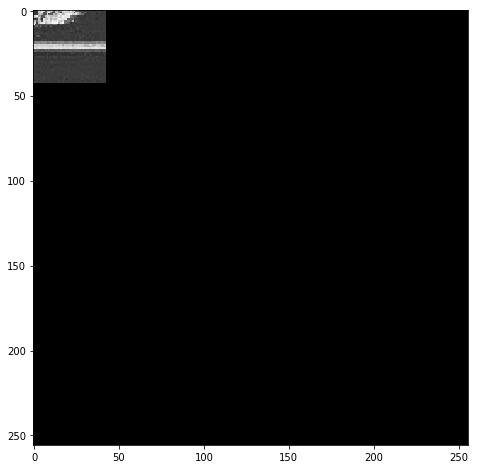

Iteration 43/256	Time: 83.9038720131 seconds
Iteration 44/256	Time: 87.7823760509 seconds
Iteration 45/256	Time: 91.6835861206 seconds
Iteration 46/256	Time: 95.6567389965 seconds
Iteration 47/256	Time: 99.714056015 seconds
Iteration 48/256	Time: 103.980501175 seconds
Iteration 49/256	Time: 108.226096153 seconds
Iteration 50/256	Time: 112.592324972 seconds
Iteration 51/256	Time: 117.001850128 seconds
Iteration 52/256	Time: 121.431351185 seconds


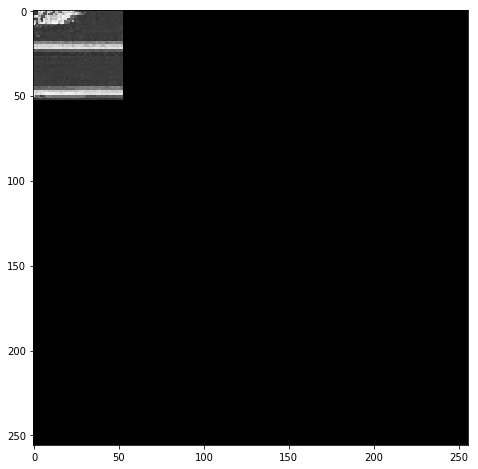

Iteration 53/256	Time: 126.213600159 seconds
Iteration 54/256	Time: 130.886644125 seconds
Iteration 55/256	Time: 135.668054104 seconds
Iteration 56/256	Time: 140.563829184 seconds
Iteration 57/256	Time: 145.567047119 seconds
Iteration 58/256	Time: 150.670787096 seconds
Iteration 59/256	Time: 155.827805042 seconds
Iteration 60/256	Time: 161.019080162 seconds
Iteration 61/256	Time: 166.37501502 seconds
Iteration 62/256	Time: 171.837120056 seconds


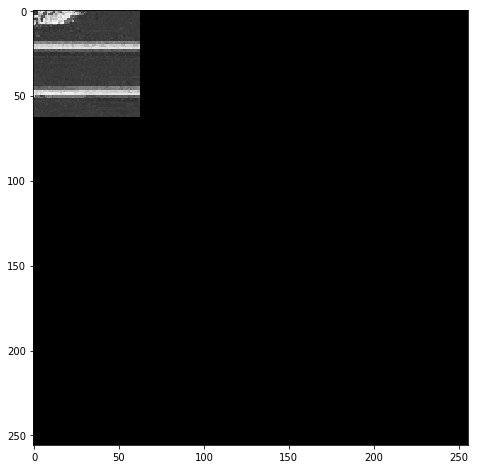

Iteration 63/256	Time: 177.39110899 seconds
Iteration 64/256	Time: 183.070551157 seconds
Iteration 65/256	Time: 188.771844149 seconds
Iteration 66/256	Time: 194.60624218 seconds
Iteration 67/256	Time: 200.57417202 seconds
Iteration 68/256	Time: 206.580687046 seconds
Iteration 69/256	Time: 212.673242092 seconds
Iteration 70/256	Time: 218.944528103 seconds
Iteration 71/256	Time: 225.254934072 seconds
Iteration 72/256	Time: 231.609440088 seconds


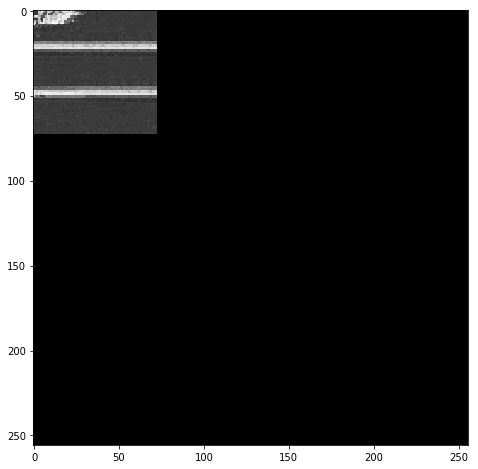

Iteration 73/256	Time: 238.177357197 seconds
Iteration 74/256	Time: 244.696012974 seconds
Iteration 75/256	Time: 251.367874146 seconds
Iteration 76/256	Time: 257.967825174 seconds
Iteration 77/256	Time: 264.795539141 seconds
Iteration 78/256	Time: 271.635197163 seconds
Iteration 79/256	Time: 278.657369137 seconds
Iteration 80/256	Time: 285.742998123 seconds
Iteration 81/256	Time: 292.894203186 seconds
Iteration 82/256	Time: 300.100680113 seconds


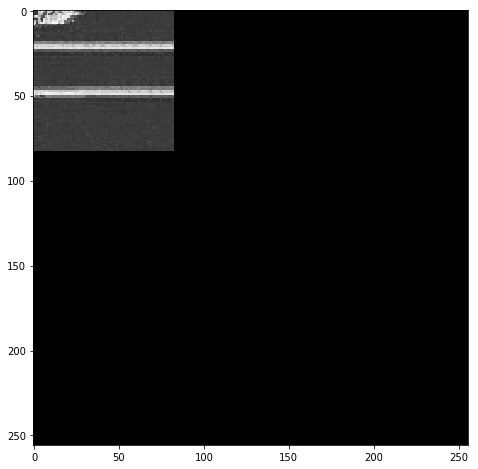

Iteration 83/256	Time: 307.568737984 seconds
Iteration 84/256	Time: 314.973222017 seconds
Iteration 85/256	Time: 322.412580967 seconds
Iteration 86/256	Time: 329.928222179 seconds
Iteration 87/256	Time: 337.440359116 seconds
Iteration 88/256	Time: 345.076475143 seconds
Iteration 89/256	Time: 352.789694071 seconds
Iteration 90/256	Time: 360.580343008 seconds
Iteration 91/256	Time: 368.454894066 seconds
Iteration 92/256	Time: 376.582180977 seconds


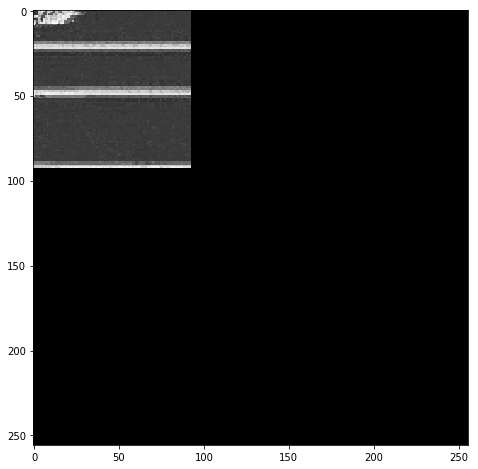

Iteration 93/256	Time: 385.173613071 seconds
Iteration 94/256	Time: 393.755069971 seconds
Iteration 95/256	Time: 402.277446985 seconds
Iteration 96/256	Time: 411.11899209 seconds
Iteration 97/256	Time: 420.155843973 seconds
Iteration 98/256	Time: 429.060952187 seconds
Iteration 99/256	Time: 438.060948133 seconds
Iteration 100/256	Time: 447.235865116 seconds
Iteration 101/256	Time: 456.507335186 seconds
Iteration 102/256	Time: 465.787474155 seconds


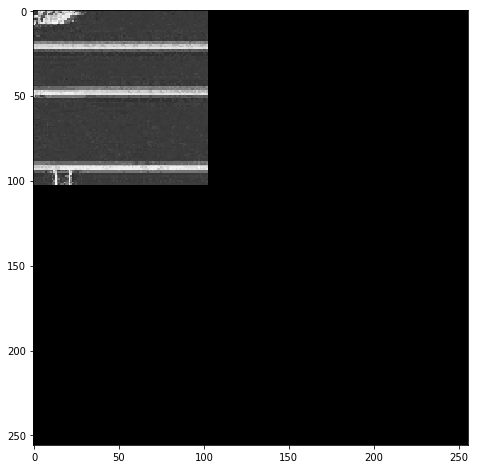

Iteration 103/256	Time: 475.401386976 seconds
Iteration 104/256	Time: 484.850728035 seconds
Iteration 105/256	Time: 494.267348051 seconds
Iteration 106/256	Time: 503.889569998 seconds
Iteration 107/256	Time: 513.496340036 seconds
Iteration 108/256	Time: 523.418250084 seconds
Iteration 109/256	Time: 533.235843182 seconds
Iteration 110/256	Time: 543.074123144 seconds
Iteration 111/256	Time: 553.009721994 seconds
Iteration 112/256	Time: 563.627525091 seconds


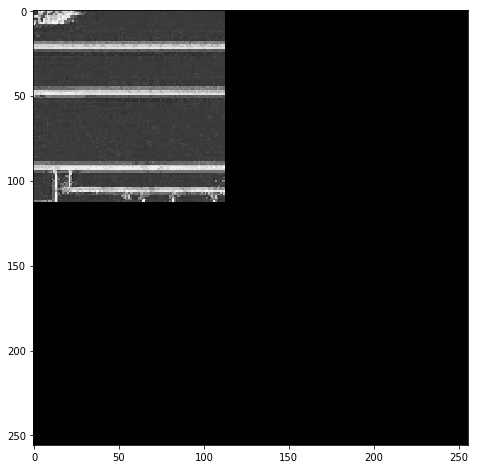

Iteration 113/256	Time: 574.024582148 seconds
Iteration 114/256	Time: 584.585616112 seconds
Iteration 115/256	Time: 594.849833012 seconds
Iteration 116/256	Time: 606.302873135 seconds
Iteration 117/256	Time: 617.04511404 seconds
Iteration 118/256	Time: 627.993465185 seconds
Iteration 119/256	Time: 638.81975913 seconds
Iteration 120/256	Time: 649.943917036 seconds
Iteration 121/256	Time: 660.995839119 seconds
Iteration 122/256	Time: 672.320240021 seconds


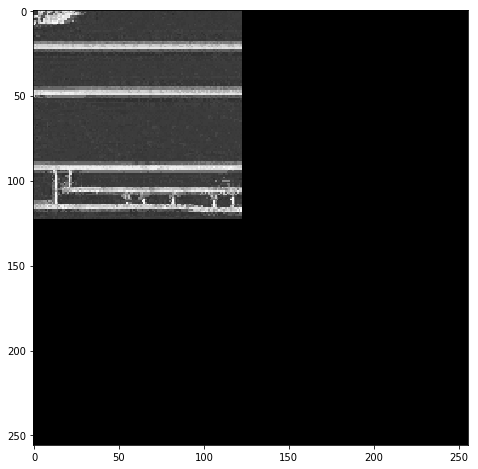

Iteration 123/256	Time: 683.964756012 seconds
Iteration 124/256	Time: 695.682095051 seconds
Iteration 125/256	Time: 707.253494978 seconds
Iteration 126/256	Time: 719.001557112 seconds
Iteration 127/256	Time: 730.863772154 seconds
Iteration 128/256	Time: 742.665307999 seconds
Iteration 129/256	Time: 754.496611118 seconds
Iteration 130/256	Time: 766.535695076 seconds
Iteration 131/256	Time: 778.701311111 seconds
Iteration 132/256	Time: 790.979889154 seconds


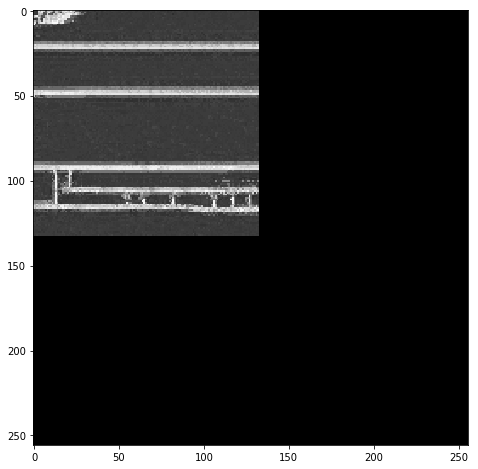

Iteration 133/256	Time: 803.733194113 seconds
Iteration 134/256	Time: 815.940616131 seconds
Iteration 135/256	Time: 828.272108078 seconds
Iteration 136/256	Time: 840.180305004 seconds
Iteration 137/256	Time: 852.078946114 seconds
Iteration 138/256	Time: 864.011945009 seconds
Iteration 139/256	Time: 876.130198002 seconds
Iteration 140/256	Time: 888.322071075 seconds
Iteration 141/256	Time: 900.587450027 seconds
Iteration 142/256	Time: 912.899994135 seconds


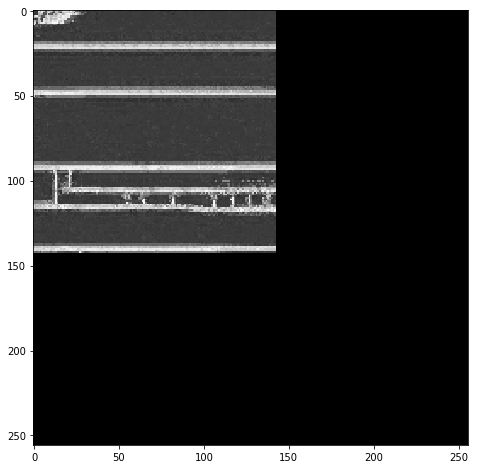

Iteration 143/256	Time: 925.639453173 seconds
Iteration 144/256	Time: 938.324351072 seconds
Iteration 145/256	Time: 951.055629015 seconds
Iteration 146/256	Time: 965.232683182 seconds
Iteration 147/256	Time: 978.537576199 seconds
Iteration 148/256	Time: 992.052308083 seconds
Iteration 149/256	Time: 1005.75150299 seconds
Iteration 150/256	Time: 1019.31145501 seconds
Iteration 151/256	Time: 1032.99630499 seconds
Iteration 152/256	Time: 1046.78164697 seconds


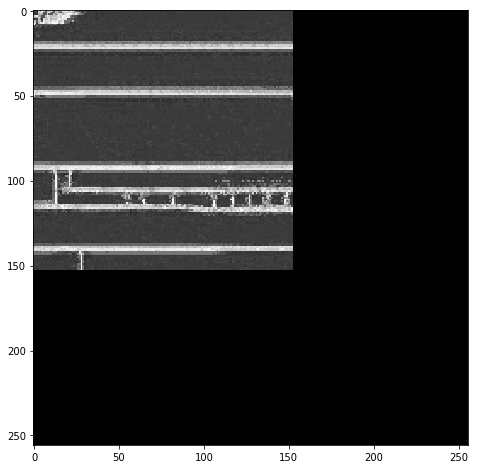

Iteration 153/256	Time: 1060.84731412 seconds
Iteration 154/256	Time: 1074.901088 seconds
Iteration 155/256	Time: 1088.86017203 seconds
Iteration 156/256	Time: 1103.02012014 seconds
Iteration 157/256	Time: 1117.15890217 seconds
Iteration 158/256	Time: 1131.41286802 seconds
Iteration 159/256	Time: 1146.03409314 seconds
Iteration 160/256	Time: 1160.60856915 seconds
Iteration 161/256	Time: 1175.18102002 seconds
Iteration 162/256	Time: 1189.76792002 seconds


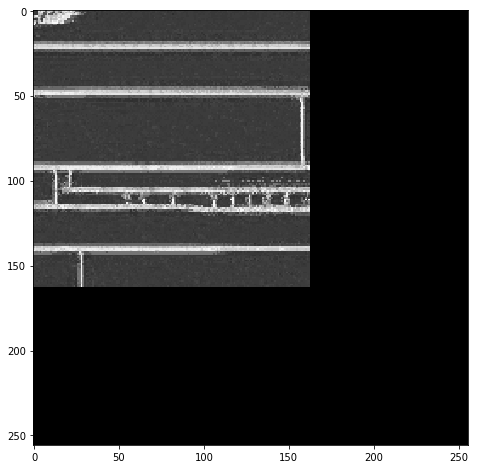

Iteration 163/256	Time: 1204.682374 seconds
Iteration 164/256	Time: 1219.59605217 seconds
Iteration 165/256	Time: 1234.43211603 seconds
Iteration 166/256	Time: 1250.17691207 seconds
Iteration 167/256	Time: 1267.80182409 seconds
Iteration 168/256	Time: 1285.5112052 seconds
Iteration 169/256	Time: 1303.46322417 seconds
Iteration 170/256	Time: 1321.17754316 seconds
Iteration 171/256	Time: 1338.94838309 seconds
Iteration 172/256	Time: 1356.93471503 seconds


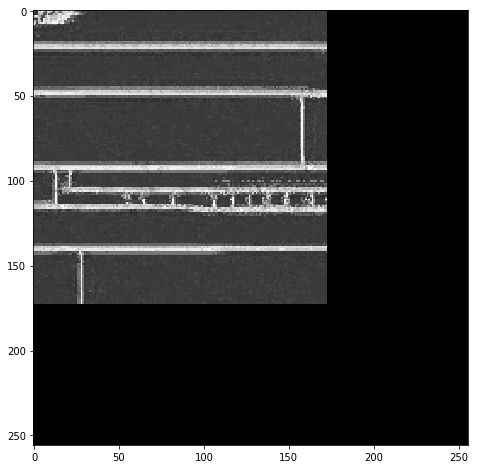

Iteration 173/256	Time: 1375.14601612 seconds
Iteration 174/256	Time: 1393.52923799 seconds
Iteration 175/256	Time: 1412.02608013 seconds
Iteration 176/256	Time: 1430.09666705 seconds
Iteration 177/256	Time: 1448.73632216 seconds
Iteration 178/256	Time: 1467.39741397 seconds
Iteration 179/256	Time: 1486.4312222 seconds
Iteration 180/256	Time: 1505.28219509 seconds
Iteration 181/256	Time: 1523.77062917 seconds
Iteration 182/256	Time: 1542.531533 seconds


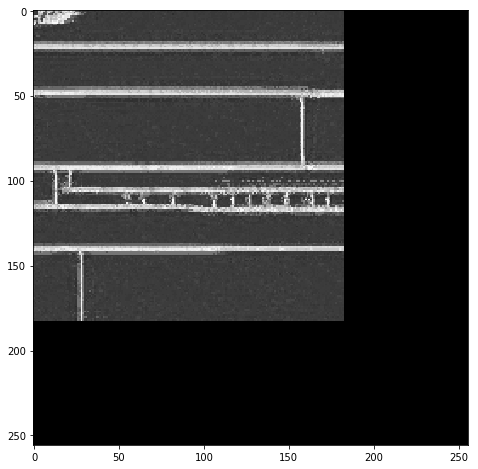

Iteration 183/256	Time: 1561.93221211 seconds
Iteration 184/256	Time: 1581.12670898 seconds
Iteration 185/256	Time: 1600.72765017 seconds
Iteration 186/256	Time: 1620.00455213 seconds
Iteration 187/256	Time: 1639.50849915 seconds
Iteration 188/256	Time: 1659.01502609 seconds
Iteration 189/256	Time: 1678.92899609 seconds
Iteration 190/256	Time: 1698.599015 seconds
Iteration 191/256	Time: 1718.55017805 seconds
Iteration 192/256	Time: 1738.97150707 seconds


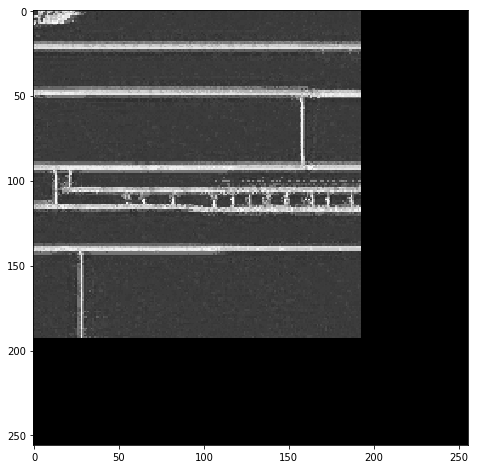

Iteration 193/256	Time: 1759.47666097 seconds
Iteration 194/256	Time: 1778.08250308 seconds
Iteration 195/256	Time: 1795.81472301 seconds
Iteration 196/256	Time: 1813.54927802 seconds
Iteration 197/256	Time: 1831.3203392 seconds
Iteration 198/256	Time: 1849.04000902 seconds
Iteration 199/256	Time: 1866.83763599 seconds
Iteration 200/256	Time: 1884.9385581 seconds
Iteration 201/256	Time: 1903.03038502 seconds
Iteration 202/256	Time: 1921.20607615 seconds


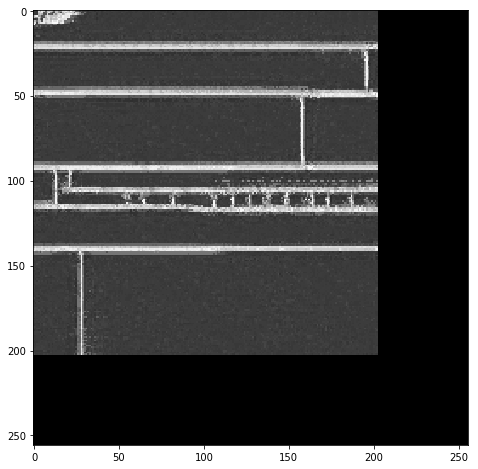

Iteration 203/256	Time: 1939.40597916 seconds
Iteration 204/256	Time: 1957.69156909 seconds
Iteration 205/256	Time: 1975.44510412 seconds
Iteration 206/256	Time: 1993.83000803 seconds
Iteration 207/256	Time: 2011.95571518 seconds
Iteration 208/256	Time: 2030.48410201 seconds
Iteration 209/256	Time: 2049.26425409 seconds
Iteration 210/256	Time: 2068.01627207 seconds
Iteration 211/256	Time: 2086.96354318 seconds
Iteration 212/256	Time: 2105.73412514 seconds


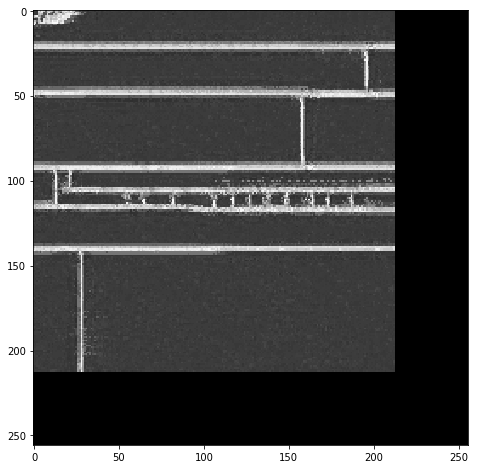

Iteration 213/256	Time: 2125.12238097 seconds
Iteration 214/256	Time: 2144.63141704 seconds
Iteration 215/256	Time: 2164.23559499 seconds
Iteration 216/256	Time: 2183.67682409 seconds
Iteration 217/256	Time: 2203.21891403 seconds
Iteration 218/256	Time: 2222.89391613 seconds
Iteration 219/256	Time: 2242.55379915 seconds
Iteration 220/256	Time: 2262.404351 seconds
Iteration 221/256	Time: 2282.28104806 seconds
Iteration 222/256	Time: 2302.25397205 seconds


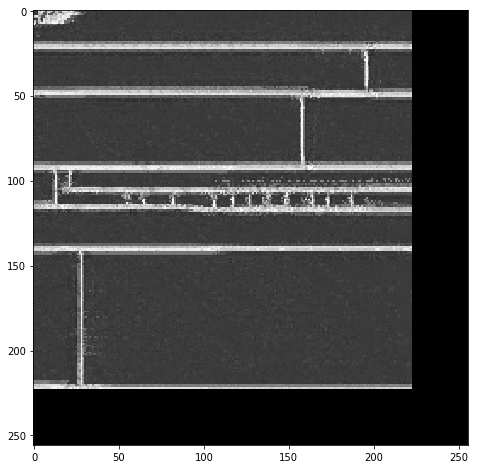

Iteration 223/256	Time: 2322.67029619 seconds
Iteration 224/256	Time: 2343.30739999 seconds
Iteration 225/256	Time: 2363.58582711 seconds
Iteration 226/256	Time: 2383.85433102 seconds
Iteration 227/256	Time: 2404.48256207 seconds
Iteration 228/256	Time: 2425.00286913 seconds
Iteration 229/256	Time: 2446.20468211 seconds
Iteration 230/256	Time: 2467.44073415 seconds
Iteration 231/256	Time: 2488.35241413 seconds
Iteration 232/256	Time: 2509.53176308 seconds


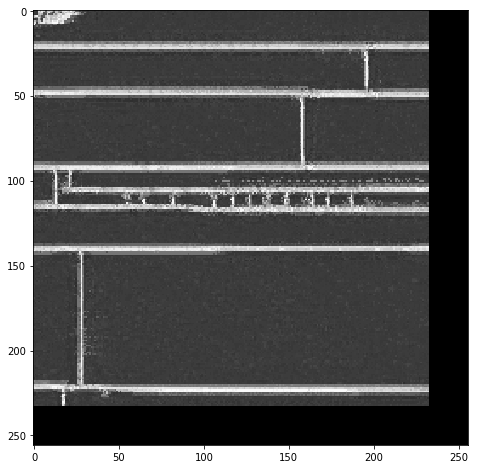

Iteration 233/256	Time: 2531.15829802 seconds
Iteration 234/256	Time: 2552.71798706 seconds
Iteration 235/256	Time: 2574.08328509 seconds
Iteration 236/256	Time: 2595.65028906 seconds
Iteration 237/256	Time: 2617.03808618 seconds
Iteration 238/256	Time: 2638.58952498 seconds
Iteration 239/256	Time: 2660.32017899 seconds
Iteration 240/256	Time: 2682.20814204 seconds
Iteration 241/256	Time: 2704.17244315 seconds
Iteration 242/256	Time: 2725.90483618 seconds


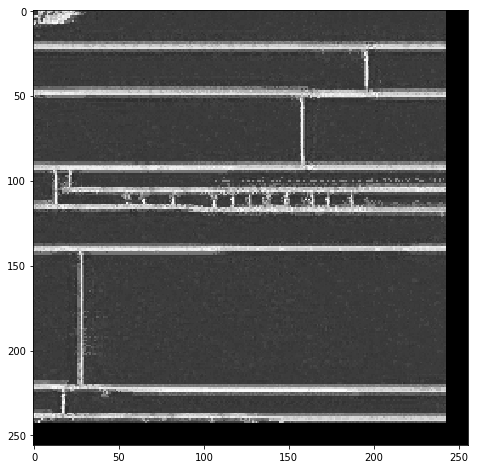

Iteration 243/256	Time: 2748.21639919 seconds
Iteration 244/256	Time: 2770.043643 seconds
Iteration 245/256	Time: 2792.10667109 seconds
Iteration 246/256	Time: 2814.36186719 seconds
Iteration 247/256	Time: 2836.570575 seconds
Iteration 248/256	Time: 2859.57816815 seconds
Iteration 249/256	Time: 2882.03481317 seconds
Iteration 250/256	Time: 2904.3879931 seconds
Iteration 251/256	Time: 2927.37509918 seconds
Iteration 252/256	Time: 2950.82998419 seconds


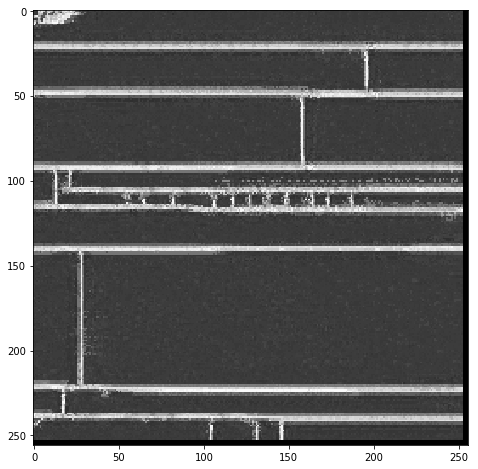

Iteration 253/256	Time: 2974.77688408 seconds
Iteration 254/256	Time: 2998.47624302 seconds
Iteration 255/256	Time: 3022.26040006 seconds
('Total Time: ', 3046.329941034317, ' seconds')


In [28]:
texture_synthesize("bricks.png", "out_bricks_128.jpg", final_size_x=256, final_size_y=256,\
                   kernel_size=15, resize_factor=128)

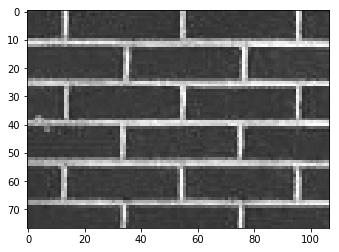

In [27]:
im = Image.open('./bricks.png').convert("L")
plt.imshow(im)
plt.show()

Iteration 3/256	Time: 0.000308990478516 seconds
Iteration 4/256	Time: 0.11066699028 seconds
Iteration 5/256	Time: 0.202145814896 seconds
Iteration 6/256	Time: 0.312384843826 seconds
Iteration 7/256	Time: 0.429234981537 seconds
Iteration 8/256	Time: 0.553279876709 seconds
Iteration 9/256	Time: 0.681275844574 seconds
Iteration 10/256	Time: 0.800927877426 seconds
Iteration 11/256	Time: 0.912442922592 seconds
Iteration 12/256	Time: 1.0310549736 seconds


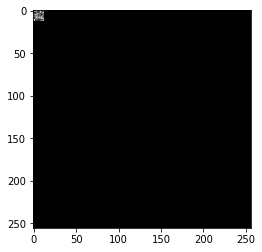

Iteration 13/256	Time: 1.25827097893 seconds
Iteration 14/256	Time: 1.38385987282 seconds
Iteration 15/256	Time: 1.51044797897 seconds
Iteration 16/256	Time: 1.64532589912 seconds
Iteration 17/256	Time: 1.78721785545 seconds
Iteration 18/256	Time: 1.93590903282 seconds
Iteration 19/256	Time: 2.09252882004 seconds
Iteration 20/256	Time: 2.25334382057 seconds
Iteration 21/256	Time: 2.42294788361 seconds
Iteration 22/256	Time: 2.60151290894 seconds


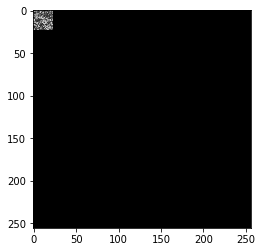

Iteration 23/256	Time: 2.88346600533 seconds
Iteration 24/256	Time: 3.07433700562 seconds
Iteration 25/256	Time: 3.25215387344 seconds
Iteration 26/256	Time: 3.44363689423 seconds
Iteration 27/256	Time: 3.64156794548 seconds
Iteration 28/256	Time: 3.84669780731 seconds
Iteration 29/256	Time: 4.05995798111 seconds
Iteration 30/256	Time: 4.27440500259 seconds
Iteration 31/256	Time: 4.49605584145 seconds
Iteration 32/256	Time: 4.72539901733 seconds


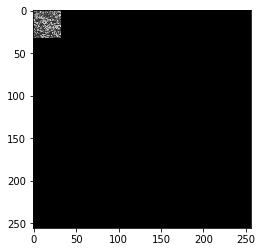

Iteration 33/256	Time: 5.06270694733 seconds
Iteration 34/256	Time: 5.33957791328 seconds
Iteration 35/256	Time: 5.60642886162 seconds
Iteration 36/256	Time: 5.87756490707 seconds
Iteration 37/256	Time: 6.1548268795 seconds
Iteration 38/256	Time: 6.4765458107 seconds
Iteration 39/256	Time: 6.8661339283 seconds
Iteration 40/256	Time: 7.23897194862 seconds
Iteration 41/256	Time: 7.57935786247 seconds
Iteration 42/256	Time: 7.87918281555 seconds


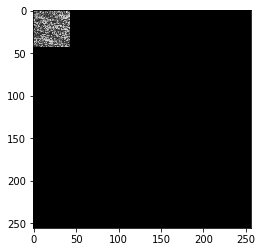

Iteration 43/256	Time: 8.26904797554 seconds
Iteration 44/256	Time: 8.57930397987 seconds
Iteration 45/256	Time: 8.88981699944 seconds
Iteration 46/256	Time: 9.21697402 seconds
Iteration 47/256	Time: 9.5505130291 seconds
Iteration 48/256	Time: 9.88190603256 seconds
Iteration 49/256	Time: 10.2168478966 seconds
Iteration 50/256	Time: 10.5281429291 seconds
Iteration 51/256	Time: 10.8322780132 seconds
Iteration 52/256	Time: 11.1486968994 seconds


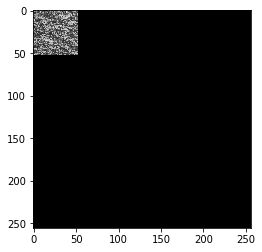

Iteration 53/256	Time: 11.5771579742 seconds
Iteration 54/256	Time: 11.9629080296 seconds
Iteration 55/256	Time: 12.2998378277 seconds
Iteration 56/256	Time: 12.6469769478 seconds
Iteration 57/256	Time: 13.0009689331 seconds
Iteration 58/256	Time: 13.3608698845 seconds
Iteration 59/256	Time: 13.7500338554 seconds
Iteration 60/256	Time: 14.1588258743 seconds
Iteration 61/256	Time: 14.5870428085 seconds
Iteration 62/256	Time: 15.0323178768 seconds


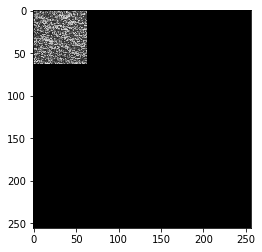

Iteration 63/256	Time: 15.5899658203 seconds
Iteration 64/256	Time: 16.0239479542 seconds
Iteration 65/256	Time: 16.4753489494 seconds
Iteration 66/256	Time: 16.9062728882 seconds
Iteration 67/256	Time: 17.3491640091 seconds
Iteration 68/256	Time: 17.7889358997 seconds
Iteration 69/256	Time: 18.2237958908 seconds
Iteration 70/256	Time: 18.654047966 seconds
Iteration 71/256	Time: 19.0913128853 seconds
Iteration 72/256	Time: 19.5063328743 seconds


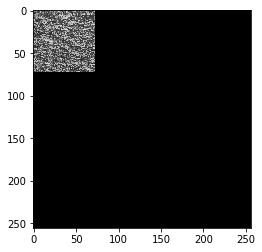

Iteration 73/256	Time: 20.0551199913 seconds
Iteration 74/256	Time: 20.5588519573 seconds
Iteration 75/256	Time: 21.0165419579 seconds
Iteration 76/256	Time: 21.4963598251 seconds
Iteration 77/256	Time: 21.9867880344 seconds
Iteration 78/256	Time: 22.4700548649 seconds
Iteration 79/256	Time: 22.940019846 seconds
Iteration 80/256	Time: 23.4294588566 seconds
Iteration 81/256	Time: 23.9496638775 seconds
Iteration 82/256	Time: 24.4639358521 seconds


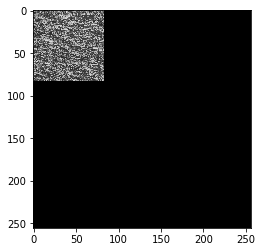

Iteration 83/256	Time: 25.0459589958 seconds
Iteration 84/256	Time: 25.5712788105 seconds
Iteration 85/256	Time: 26.1037988663 seconds
Iteration 86/256	Time: 26.6480238438 seconds
Iteration 87/256	Time: 27.1891219616 seconds
Iteration 88/256	Time: 27.7360768318 seconds
Iteration 89/256	Time: 28.3036379814 seconds
Iteration 90/256	Time: 28.8864610195 seconds
Iteration 91/256	Time: 29.4316878319 seconds
Iteration 92/256	Time: 30.0106759071 seconds


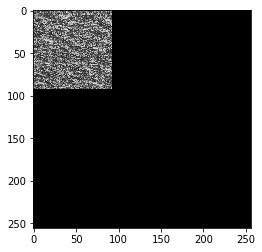

Iteration 93/256	Time: 30.727421999 seconds
Iteration 94/256	Time: 31.3263828754 seconds
Iteration 95/256	Time: 31.9233019352 seconds
Iteration 96/256	Time: 32.5399878025 seconds
Iteration 97/256	Time: 33.1556248665 seconds
Iteration 98/256	Time: 33.775261879 seconds
Iteration 99/256	Time: 34.354916811 seconds
Iteration 100/256	Time: 34.9847979546 seconds
Iteration 101/256	Time: 35.6145830154 seconds
Iteration 102/256	Time: 36.2533209324 seconds


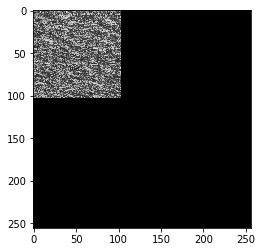

Iteration 103/256	Time: 37.0043928623 seconds
Iteration 104/256	Time: 37.6487360001 seconds
Iteration 105/256	Time: 38.2950079441 seconds
Iteration 106/256	Time: 38.9337098598 seconds
Iteration 107/256	Time: 39.6071999073 seconds
Iteration 108/256	Time: 40.2920839787 seconds
Iteration 109/256	Time: 40.9617979527 seconds
Iteration 110/256	Time: 41.6357028484 seconds
Iteration 111/256	Time: 42.2868149281 seconds
Iteration 112/256	Time: 42.944767952 seconds


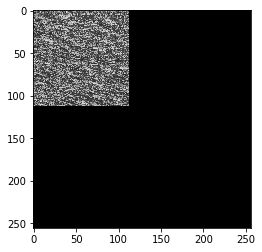

Iteration 113/256	Time: 43.7464458942 seconds
Iteration 114/256	Time: 44.4472568035 seconds
Iteration 115/256	Time: 45.1301209927 seconds
Iteration 116/256	Time: 45.8228318691 seconds
Iteration 117/256	Time: 46.5041968822 seconds
Iteration 118/256	Time: 47.2368798256 seconds
Iteration 119/256	Time: 47.9750659466 seconds
Iteration 120/256	Time: 48.7300469875 seconds
Iteration 121/256	Time: 49.4786908627 seconds
Iteration 122/256	Time: 50.2340109348 seconds


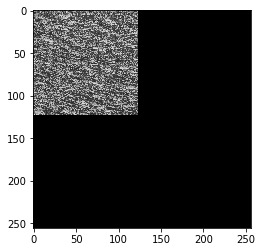

Iteration 123/256	Time: 51.1271269321 seconds
Iteration 124/256	Time: 51.8924369812 seconds
Iteration 125/256	Time: 52.702657938 seconds
Iteration 126/256	Time: 53.5237298012 seconds
Iteration 127/256	Time: 54.2882499695 seconds
Iteration 128/256	Time: 55.0561749935 seconds
Iteration 129/256	Time: 55.8176169395 seconds
Iteration 130/256	Time: 56.6144118309 seconds
Iteration 131/256	Time: 57.3931720257 seconds
Iteration 132/256	Time: 58.1787359715 seconds


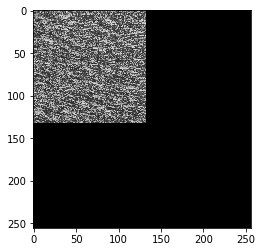

Iteration 133/256	Time: 59.1359128952 seconds
Iteration 134/256	Time: 59.9259459972 seconds
Iteration 135/256	Time: 60.7304079533 seconds
Iteration 136/256	Time: 61.5191829205 seconds
Iteration 137/256	Time: 62.3094749451 seconds
Iteration 138/256	Time: 63.1055660248 seconds
Iteration 139/256	Time: 63.9007019997 seconds
Iteration 140/256	Time: 64.7072148323 seconds
Iteration 141/256	Time: 65.5159540176 seconds
Iteration 142/256	Time: 66.3431148529 seconds


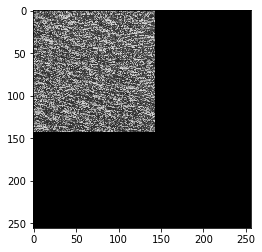

Iteration 143/256	Time: 67.2647438049 seconds
Iteration 144/256	Time: 68.1528458595 seconds
Iteration 145/256	Time: 68.9792129993 seconds
Iteration 146/256	Time: 69.8192389011 seconds
Iteration 147/256	Time: 70.9223148823 seconds
Iteration 148/256	Time: 71.9044718742 seconds
Iteration 149/256	Time: 72.843146801 seconds
Iteration 150/256	Time: 73.8096759319 seconds
Iteration 151/256	Time: 74.7273800373 seconds
Iteration 152/256	Time: 75.6808309555 seconds


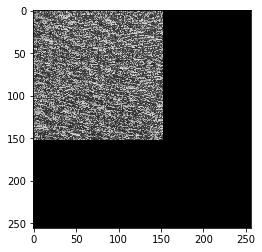

Iteration 153/256	Time: 76.7257268429 seconds
Iteration 154/256	Time: 77.6918559074 seconds
Iteration 155/256	Time: 78.6487309933 seconds
Iteration 156/256	Time: 79.6159198284 seconds
Iteration 157/256	Time: 80.5901939869 seconds
Iteration 158/256	Time: 81.5510129929 seconds
Iteration 159/256	Time: 82.5294258595 seconds
Iteration 160/256	Time: 83.6276669502 seconds
Iteration 161/256	Time: 84.6916549206 seconds
Iteration 162/256	Time: 85.7065579891 seconds


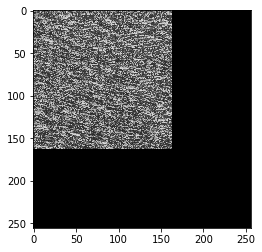

Iteration 163/256	Time: 86.7540359497 seconds
Iteration 164/256	Time: 87.8107659817 seconds
Iteration 165/256	Time: 89.0155599117 seconds
Iteration 166/256	Time: 90.0960338116 seconds
Iteration 167/256	Time: 91.1067979336 seconds
Iteration 168/256	Time: 92.086275816 seconds
Iteration 169/256	Time: 93.2565648556 seconds
Iteration 170/256	Time: 94.3681440353 seconds
Iteration 171/256	Time: 95.3897628784 seconds
Iteration 172/256	Time: 96.39929986 seconds


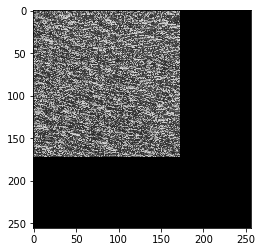

Iteration 173/256	Time: 97.5835309029 seconds
Iteration 174/256	Time: 98.6617078781 seconds
Iteration 175/256	Time: 99.7704758644 seconds
Iteration 176/256	Time: 100.767063856 seconds
Iteration 177/256	Time: 101.813503981 seconds
Iteration 178/256	Time: 102.940290928 seconds
Iteration 179/256	Time: 103.975548983 seconds
Iteration 180/256	Time: 105.009436846 seconds
Iteration 181/256	Time: 106.482405901 seconds
Iteration 182/256	Time: 107.711800814 seconds


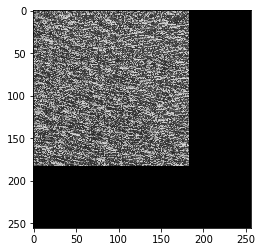

Iteration 183/256	Time: 109.079998016 seconds
Iteration 184/256	Time: 110.44748497 seconds
Iteration 185/256	Time: 111.726643801 seconds
Iteration 186/256	Time: 113.015146017 seconds
Iteration 187/256	Time: 114.24506402 seconds
Iteration 188/256	Time: 115.483814001 seconds
Iteration 189/256	Time: 116.738616943 seconds
Iteration 190/256	Time: 118.005898952 seconds
Iteration 191/256	Time: 119.300550938 seconds
Iteration 192/256	Time: 120.598907948 seconds


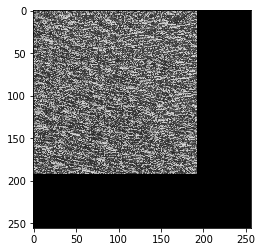

Iteration 193/256	Time: 121.987499952 seconds
Iteration 194/256	Time: 123.435745001 seconds
Iteration 195/256	Time: 124.823937893 seconds
Iteration 196/256	Time: 126.140955925 seconds
Iteration 197/256	Time: 127.446077824 seconds
Iteration 198/256	Time: 128.820181847 seconds
Iteration 199/256	Time: 130.137609005 seconds
Iteration 200/256	Time: 131.504763842 seconds
Iteration 201/256	Time: 132.909897804 seconds
Iteration 202/256	Time: 134.312191963 seconds


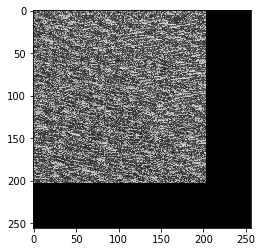

Iteration 203/256	Time: 135.784271955 seconds
Iteration 204/256	Time: 137.258136034 seconds
Iteration 205/256	Time: 138.619993925 seconds
Iteration 206/256	Time: 140.033152819 seconds
Iteration 207/256	Time: 141.403679848 seconds
Iteration 208/256	Time: 142.781503916 seconds
Iteration 209/256	Time: 144.244071007 seconds
Iteration 210/256	Time: 145.66661787 seconds
Iteration 211/256	Time: 147.115171909 seconds
Iteration 212/256	Time: 148.531200886 seconds


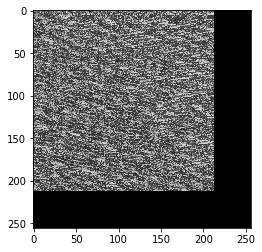

Iteration 213/256	Time: 150.124294996 seconds
Iteration 214/256	Time: 151.651129007 seconds
Iteration 215/256	Time: 153.157995939 seconds
Iteration 216/256	Time: 154.642205 seconds
Iteration 217/256	Time: 156.109582901 seconds
Iteration 218/256	Time: 157.58019495 seconds
Iteration 219/256	Time: 159.044051886 seconds
Iteration 220/256	Time: 160.565685034 seconds
Iteration 221/256	Time: 162.051766872 seconds
Iteration 222/256	Time: 163.510764837 seconds


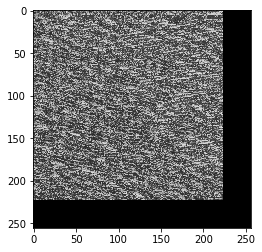

Iteration 223/256	Time: 165.141741037 seconds
Iteration 224/256	Time: 166.818912029 seconds
Iteration 225/256	Time: 168.330724955 seconds
Iteration 226/256	Time: 169.920724869 seconds
Iteration 227/256	Time: 171.485720873 seconds
Iteration 228/256	Time: 173.022428036 seconds
Iteration 229/256	Time: 174.596004009 seconds
Iteration 230/256	Time: 176.139863014 seconds
Iteration 231/256	Time: 177.726909876 seconds
Iteration 232/256	Time: 179.314185858 seconds


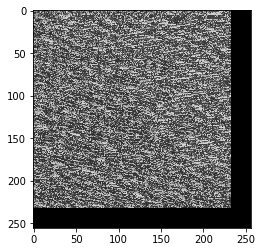

Iteration 233/256	Time: 181.019784927 seconds
Iteration 234/256	Time: 182.720209837 seconds
Iteration 235/256	Time: 184.323764801 seconds
Iteration 236/256	Time: 185.935835838 seconds
Iteration 237/256	Time: 187.538787842 seconds
Iteration 238/256	Time: 189.164834976 seconds
Iteration 239/256	Time: 190.795389891 seconds
Iteration 240/256	Time: 192.433597803 seconds
Iteration 241/256	Time: 194.073349953 seconds
Iteration 242/256	Time: 195.73849988 seconds


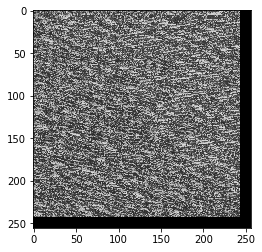

Iteration 243/256	Time: 197.510316849 seconds
Iteration 244/256	Time: 199.266218901 seconds
Iteration 245/256	Time: 201.005961895 seconds
Iteration 246/256	Time: 202.73931098 seconds
Iteration 247/256	Time: 204.560140848 seconds
Iteration 248/256	Time: 206.50901103 seconds
Iteration 249/256	Time: 208.61073494 seconds
Iteration 250/256	Time: 210.857403994 seconds
Iteration 251/256	Time: 213.231981993 seconds
Iteration 252/256	Time: 215.7224648 seconds


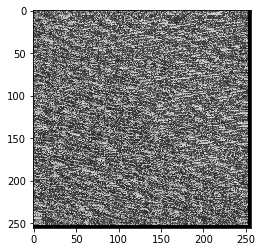

Iteration 253/256	Time: 218.472071886 seconds
Iteration 254/256	Time: 221.337911844 seconds
Iteration 255/256	Time: 224.208529949 seconds
('Total Time: ', 227.1951458454132, ' seconds')


In [13]:
texture_synthesize("sticks.png", "out_sticks.jpg", final_size_x=256, final_size_y=256,\
                   kernel_size=10, resize_factor=64)

Iteration 3/128	Time: 0.000231027603149 seconds
Iteration 4/128	Time: 0.186876058578 seconds
Iteration 5/128	Time: 0.384098052979 seconds
Iteration 6/128	Time: 0.606539964676 seconds
Iteration 7/128	Time: 0.834718942642 seconds
Iteration 8/128	Time: 1.06191110611 seconds
Iteration 9/128	Time: 1.30789995193 seconds
Iteration 10/128	Time: 1.58707499504 seconds
Iteration 11/128	Time: 1.87645292282 seconds
Iteration 12/128	Time: 2.19604897499 seconds


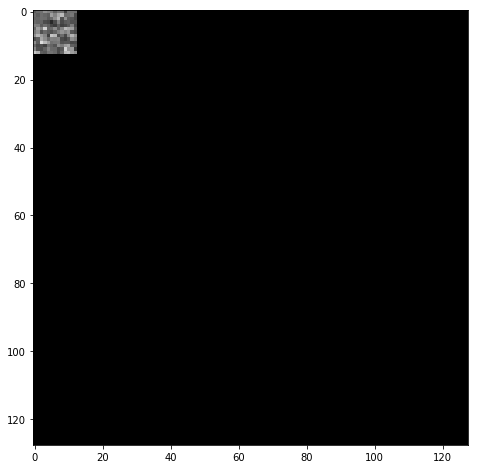

Iteration 13/128	Time: 2.69159913063 seconds
Iteration 14/128	Time: 3.09333896637 seconds
Iteration 15/128	Time: 3.49435091019 seconds
Iteration 16/128	Time: 3.92713904381 seconds
Iteration 17/128	Time: 4.3847630024 seconds
Iteration 18/128	Time: 4.86235713959 seconds
Iteration 19/128	Time: 5.37284111977 seconds
Iteration 20/128	Time: 5.93765902519 seconds
Iteration 21/128	Time: 6.4951851368 seconds
Iteration 22/128	Time: 7.06502008438 seconds


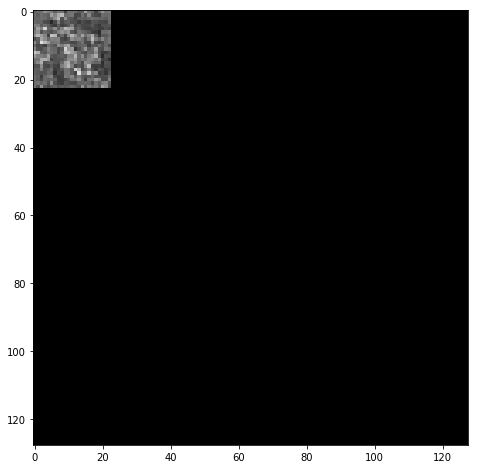

Iteration 23/128	Time: 7.8487200737 seconds
Iteration 24/128	Time: 8.53534507751 seconds
Iteration 25/128	Time: 9.22678613663 seconds
Iteration 26/128	Time: 9.91883111 seconds
Iteration 27/128	Time: 10.6465480328 seconds
Iteration 28/128	Time: 11.4278979301 seconds
Iteration 29/128	Time: 12.1930670738 seconds
Iteration 30/128	Time: 12.9949719906 seconds
Iteration 31/128	Time: 13.7935431004 seconds
Iteration 32/128	Time: 14.6479740143 seconds


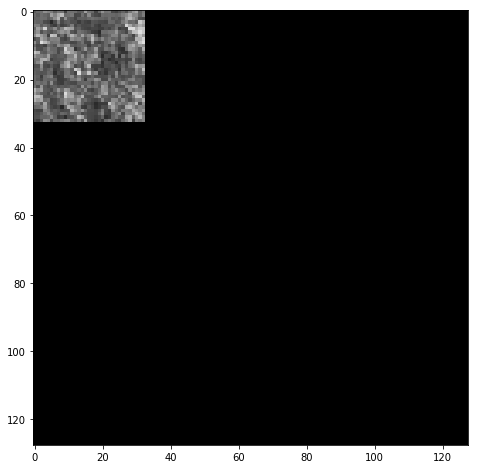

Iteration 33/128	Time: 15.6510441303 seconds
Iteration 34/128	Time: 16.5684640408 seconds
Iteration 35/128	Time: 17.5319521427 seconds
Iteration 36/128	Time: 18.5190689564 seconds
Iteration 37/128	Time: 19.5157899857 seconds
Iteration 38/128	Time: 20.515599966 seconds
Iteration 39/128	Time: 21.5803971291 seconds
Iteration 40/128	Time: 22.6412630081 seconds
Iteration 41/128	Time: 23.7622289658 seconds
Iteration 42/128	Time: 24.887609005 seconds


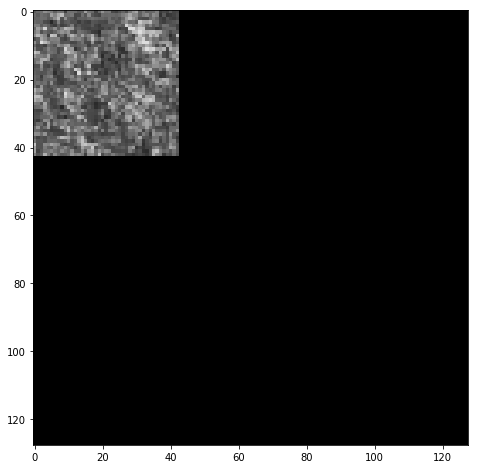

Iteration 43/128	Time: 26.1452801228 seconds
Iteration 44/128	Time: 27.3785660267 seconds
Iteration 45/128	Time: 28.6022610664 seconds
Iteration 46/128	Time: 29.802726984 seconds
Iteration 47/128	Time: 31.0666670799 seconds
Iteration 48/128	Time: 32.3330600262 seconds
Iteration 49/128	Time: 33.6407320499 seconds
Iteration 50/128	Time: 34.9700739384 seconds
Iteration 51/128	Time: 36.3639519215 seconds
Iteration 52/128	Time: 37.7586140633 seconds


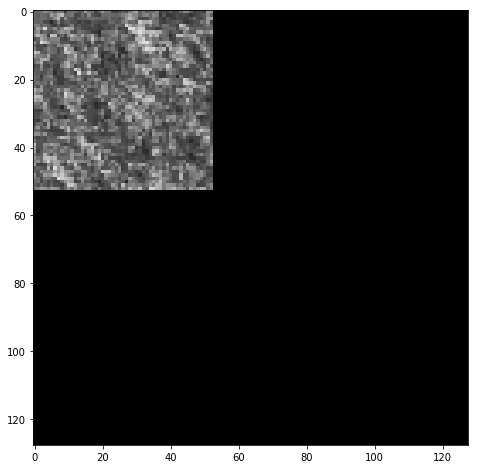

Iteration 53/128	Time: 39.3630919456 seconds
Iteration 54/128	Time: 40.8101239204 seconds
Iteration 55/128	Time: 42.3043079376 seconds
Iteration 56/128	Time: 43.7657539845 seconds
Iteration 57/128	Time: 45.2788510323 seconds
Iteration 58/128	Time: 46.8047969341 seconds
Iteration 59/128	Time: 48.4112999439 seconds
Iteration 60/128	Time: 49.9952580929 seconds
Iteration 61/128	Time: 51.6209061146 seconds
Iteration 62/128	Time: 53.2529609203 seconds


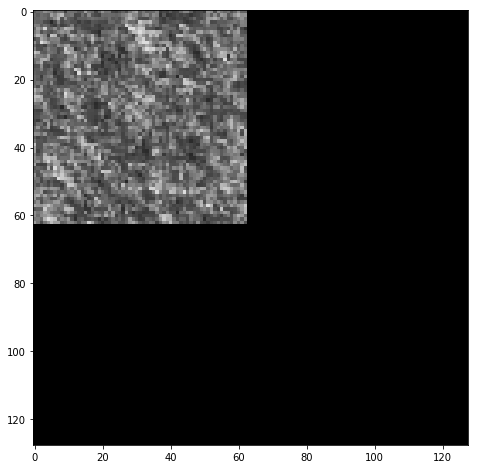

Iteration 63/128	Time: 55.0494420528 seconds
Iteration 64/128	Time: 56.7745919228 seconds
Iteration 65/128	Time: 58.5220530033 seconds
Iteration 66/128	Time: 60.2855601311 seconds
Iteration 67/128	Time: 62.1234869957 seconds
Iteration 68/128	Time: 63.9643859863 seconds
Iteration 69/128	Time: 65.8692500591 seconds
Iteration 70/128	Time: 67.856883049 seconds
Iteration 71/128	Time: 69.8764309883 seconds
Iteration 72/128	Time: 71.7861330509 seconds


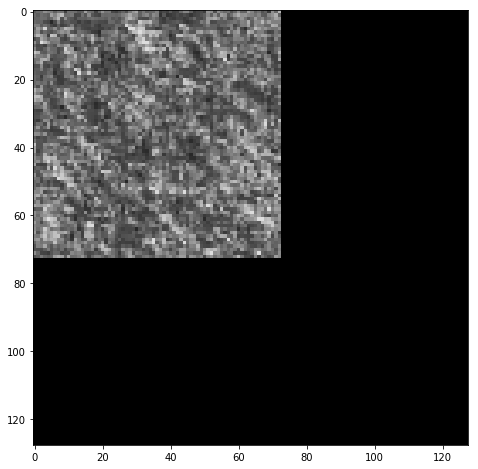

Iteration 73/128	Time: 73.8065719604 seconds
Iteration 74/128	Time: 75.746917963 seconds
Iteration 75/128	Time: 77.7480790615 seconds
Iteration 76/128	Time: 79.7270550728 seconds
Iteration 77/128	Time: 81.7145180702 seconds
Iteration 78/128	Time: 83.7357180119 seconds
Iteration 79/128	Time: 85.7737600803 seconds
Iteration 80/128	Time: 87.8376851082 seconds
Iteration 81/128	Time: 89.9424729347 seconds
Iteration 82/128	Time: 92.065114975 seconds


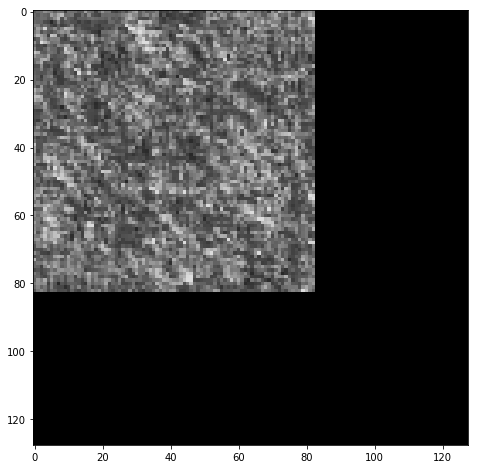

Iteration 83/128	Time: 94.3501939774 seconds
Iteration 84/128	Time: 96.5420501232 seconds
Iteration 85/128	Time: 98.8064680099 seconds
Iteration 86/128	Time: 101.058205128 seconds
Iteration 87/128	Time: 103.30430603 seconds
Iteration 88/128	Time: 105.653825045 seconds
Iteration 89/128	Time: 108.045354128 seconds
Iteration 90/128	Time: 110.374670982 seconds
Iteration 91/128	Time: 112.727843046 seconds
Iteration 92/128	Time: 115.121541023 seconds


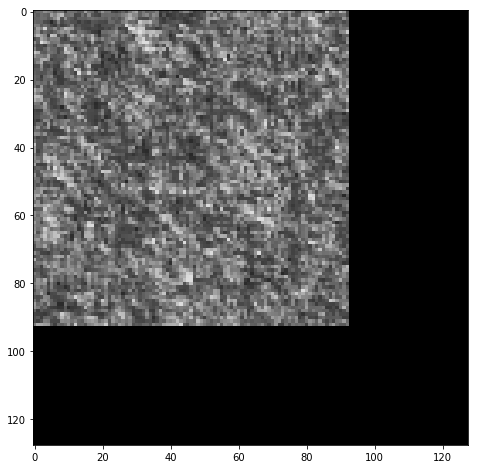

Iteration 93/128	Time: 117.726220131 seconds
Iteration 94/128	Time: 120.13996911 seconds
Iteration 95/128	Time: 122.565129995 seconds
Iteration 96/128	Time: 125.024188995 seconds
Iteration 97/128	Time: 127.640236139 seconds
Iteration 98/128	Time: 130.24217701 seconds
Iteration 99/128	Time: 132.775603056 seconds
Iteration 100/128	Time: 135.327373981 seconds
Iteration 101/128	Time: 137.895918131 seconds
Iteration 102/128	Time: 140.505429983 seconds


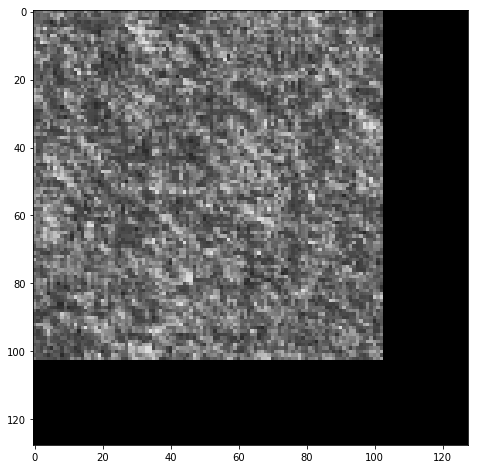

Iteration 103/128	Time: 143.279153109 seconds
Iteration 104/128	Time: 146.047199965 seconds
Iteration 105/128	Time: 148.792480946 seconds
Iteration 106/128	Time: 151.583172083 seconds
Iteration 107/128	Time: 154.454306126 seconds
Iteration 108/128	Time: 157.318181038 seconds
Iteration 109/128	Time: 160.258513927 seconds
Iteration 110/128	Time: 163.121428013 seconds
Iteration 111/128	Time: 166.022202969 seconds
Iteration 112/128	Time: 168.909642935 seconds


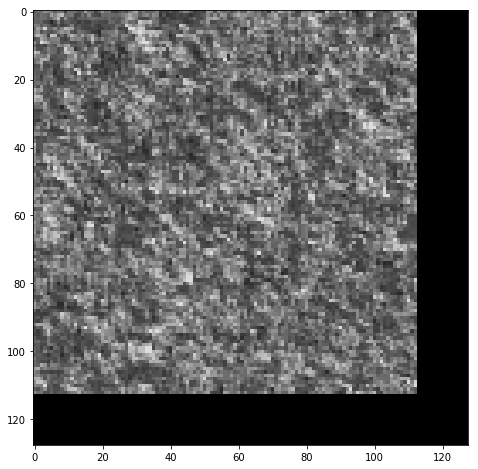

Iteration 113/128	Time: 171.965650082 seconds
Iteration 114/128	Time: 174.944174051 seconds
Iteration 115/128	Time: 177.92217803 seconds
Iteration 116/128	Time: 180.942111015 seconds
Iteration 117/128	Time: 184.001327991 seconds
Iteration 118/128	Time: 187.083265066 seconds
Iteration 119/128	Time: 190.171602964 seconds
Iteration 120/128	Time: 193.273705006 seconds
Iteration 121/128	Time: 196.415749073 seconds
Iteration 122/128	Time: 199.581434965 seconds


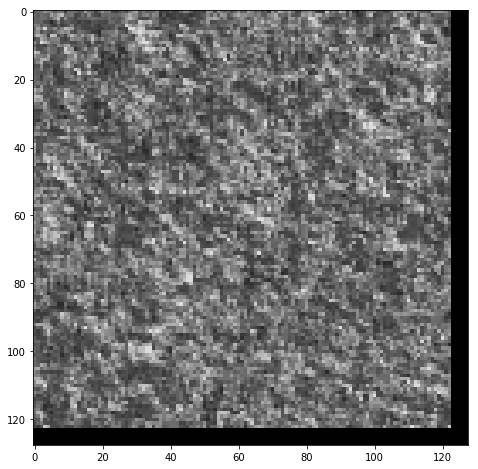

Iteration 123/128	Time: 202.902115107 seconds
Iteration 124/128	Time: 206.123853922 seconds
Iteration 125/128	Time: 209.368314981 seconds
Iteration 126/128	Time: 212.620242119 seconds
Iteration 127/128	Time: 215.946661949 seconds
('Total Time: ', 219.48817706108093, ' seconds')


In [26]:
texture_synthesize("sticks.png", "out_sticks.jpg", final_size_x=128, final_size_y=128,\
                   kernel_size=3, resize_factor=64)

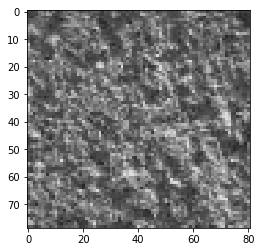

In [25]:
im = Image.open('./sticks.png').convert("L")
plt.imshow(im)
plt.show()